Data Source: https://developer.imdb.com/non-commercial-datasets/

Group 12: Statistical Data Analysis - Code

Group Members:  Tayseer Dadouche,
                Jun Gao,
                Samuel Hsieh,
                Thomas Parent,
                Roxanne Rillon,
                Yixuan Wei

# Data Import and Cleaning

In [1]:
#Samuel
#setup
from urllib.request import urlretrieve
import gzip as gz
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
import statsmodels.formula.api as sm
from statsmodels.graphics.regressionplots import plot_regress_exog, plot_fit, plot_leverage_resid2, influence_plot
from statsmodels.graphics.gofplots import qqplot
import plotly.express as px
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import normal_ad
import plotly.express as px
import math
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from scipy.stats import boxcox
pd.set_option('display.max_columns', None)

url = 'https://datasets.imdbws.com/'
files_names = ['title.basics', 'title.crew', 'name.basics', 'title.ratings']
ext = '.tsv.','gz'

In [2]:
#Samuel
#Download data and unzip
for file_name in files_names:
  urlretrieve((url+file_name+ext[0]+ext[1]),file_name+ext[0]+ext[1])

for file_name in files_names:
  with gz.open(file_name+ext[0]+ext[1], 'rb') as f_in:
    with open(file_name+ext[0], 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)


In [3]:
#Samuel
#join data into master data frames and clean

master_df = None

def load_merge(file_name, master_df):
  df = pd.read_csv(file_name+ext[0], sep='\t')
  if file_name == 'name.basics':
    df = df[df['primaryProfession'].str.startswith(('director','directress'))] # only these jobs
    df = df.drop(['birthYear','deathYear','primaryProfession'],axis=1)
    return master_df.join(df.set_index('nconst'), on='directors', how='inner')
  elif file_name == 'title.basics':
    df = df[df['runtimeMinutes'] != '\\N'] # remove unknown runtime
    df = df[df['titleType'] == 'movie'] # only movies
    df = df[df['genres'] != '\\N'] # remove unkown genres
    df = df[df['startYear'] != '\\N'] # remove unknown release year
    df = df[2024 - pd.to_numeric(df['startYear']) <= 50] # remove movies older than 50 year
    df = df[pd.to_numeric(df['runtimeMinutes']) >= 60] # longer than 1 hour
    return df.drop(['titleType','originalTitle','endYear'],axis=1)
  elif file_name == 'title.crew':
    df = df.drop(['writers'], axis=1)
    df = df[df['directors'] != '\\N']
    df = df.explode('directors')
    return master_df.join(df.set_index('tconst'), on='tconst', how='inner')
  elif file_name == 'title.ratings':
    return master_df.join(df.set_index('tconst'), on='tconst', how='inner')

for file_name in files_names:
  master_df = load_merge(file_name, master_df)


<ipython-input-3-08ce60de259e>:7: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_name+ext[0], sep='\t')


In [4]:
# Samuel
# drop all remaining empty values due to large dataset
for c in master_df.columns:
  master_df = master_df[master_df[c] != '\\N']
master_df

,tconst,primaryTitle,isAdult,startYear,runtimeMinutes,genres,directors,primaryName,knownForTitles,averageRating,numVotes
15481,tt0015724,Dama de noche,0,1993,102,"Drama,Mystery,Romance",nm0529960,Eva López Sánchez,"tt0151790,tt0314085,tt0015724,tt1139666",6.5,30
300523,tt0314085,Francisca,0,2002,88,"Drama,Thriller",nm0529960,Eva López Sánchez,"tt0151790,tt0314085,tt0015724,tt1139666",5.8,124
1741687,tt1139666,One for the Road,0,2009,90,Drama,nm0529960,Eva López Sánchez,"tt0151790,tt0314085,tt0015724,tt1139666",6.2,250
35959,tt0036606,"Another Time, Another Place",0,1983,118,"Drama,War",nm0705535,Michael Radford,"tt0087803,tt0110877,tt0379889,tt2113659",6.4,359
85866,tt0087803,1984,0,1984,113,"Drama,Sci-Fi",nm0705535,Michael Radford,"tt0087803,tt0110877,tt0379889,tt2113659",7.1,80554
...,...,...,...,...,...,...,...,...,...,...,...
10986905,tt9911006,Ormma,0,2019,127,Drama,nm10536350,Suresh Thiruvalla,"tt9911006,tt30106114",6.4,12
10988643,tt9914642,Albatross,0,2017,97,Documentary,nm5300859,Chris Jordan,"tt9914642,tt2428672",8.4,50
10989168,tt9915872,The Last White Witch,0,2019,97,"Comedy,Drama,Fantasy",nm8063415,Hideki Kiyota,"tt5624216,tt12020994,tt12035488,tt30068556",6.4,9
10989304,tt9916160,Drømmeland,0,2019,72,Documentary,nm5684093,Joost van der Wiel,"tt2927550,tt29298267,tt9916160,tt11963738",6.2,52


In [5]:
# Samuel
# verify that there is no duplicate titles due to exploding directors columnn
master_df['tconst'].value_counts()

,count
tconst,
tt9916730,1
tt0015724,1
tt0314085,1
tt9872614,1
tt9874080,1
...,...
tt0120594,1
tt0217355,1
tt0379889,1


In [6]:
# Grace

# histogram of the average rating distribution

fig = px.histogram(master_df, x="averageRating",# color = 'numVotes',
                  title = 'Distribution of the Average Rating',  histnorm='percent',
                   color_discrete_sequence=['purple'], # color of histogram bars
                  nbins=50, height = 600,
                  width = 1200,
                    )
fig.update_traces(opacity=0.55)
fig.update_yaxes(title_text='Pct of records')
fig.update_xaxes(title_text='Average Rating')
fig.update_layout(barmode='group') #overlay'overlay)
fig.show()

In [7]:
# Samuel
# cast to appropriate data types
master_df.info()
master_df['runtimeMinutes'] = master_df['runtimeMinutes'].astype('int')
master_df['startYear'] = master_df['startYear'].astype('int')
master_df = master_df.set_index('tconst')

<class 'pandas.core.frame.DataFrame'>
Index: 103459 entries, 15481 to 10989575
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   tconst          103459 non-null  object 
 1   primaryTitle    103459 non-null  object 
 2   isAdult         103459 non-null  object 
 3   startYear       103459 non-null  object 
 4   runtimeMinutes  103459 non-null  object 
 5   genres          103459 non-null  object 
 6   directors       103459 non-null  object 
 7   primaryName     103459 non-null  object 
 8   knownForTitles  103459 non-null  object 
 9   averageRating   103459 non-null  float64
 10  numVotes        103459 non-null  int64  
dtypes: float64(1), int64(1), object(9)
memory usage: 9.5+ MB


In [8]:
# Samuel

# data engineering
master_df['wordsInTitle'] = master_df['primaryTitle'].apply(lambda t: len(str.split(t)))
master_df['charsInTitle'] = master_df['primaryTitle'].apply(lambda t: len(t))
master_df['numKownForTitles'] = master_df['knownForTitles'].apply(lambda ts: len(str.split(ts, ',')))
master_df = master_df.drop(['knownForTitles'], axis=1)
# get director counts
director_counts = master_df['directors'].value_counts()
master_df = master_df.join(director_counts, on='directors', how='inner')
master_df = master_df.rename({'count':'numTitleByDirector','primaryName':'director'}, axis=1)
# get top directors
top_directors = list(director_counts[director_counts > 5].index)
master_df['topDirector'] = master_df['directors'].apply(lambda d: 1 if any([d in top_directors]) else 0)
master_df = master_df.drop(['directors'], axis=1)
#Variables for data transformations
master_df['sqr_runtime'] = master_df['runtimeMinutes'].apply(lambda rt: math.sqrt(rt))

master_df



,primaryTitle,isAdult,startYear,runtimeMinutes,genres,director,averageRating,numVotes,wordsInTitle,charsInTitle,numKownForTitles,numTitleByDirector,topDirector,sqr_runtime
tconst,,,,,,,,,,,,,,
tt0015724,Dama de noche,0,1993,102,"Drama,Mystery,Romance",Eva López Sánchez,6.5,30,3,13,4,3,0,10.099505
tt0314085,Francisca,0,2002,88,"Drama,Thriller",Eva López Sánchez,5.8,124,1,9,4,3,0,9.380832
tt1139666,One for the Road,0,2009,90,Drama,Eva López Sánchez,6.2,250,4,16,4,3,0,9.486833
tt0036606,"Another Time, Another Place",0,1983,118,"Drama,War",Michael Radford,6.4,359,4,27,4,10,1,10.862780
tt0087803,1984,0,1984,113,"Drama,Sci-Fi",Michael Radford,7.1,80554,1,4,4,10,1,10.630146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9911006,Ormma,0,2019,127,Drama,Suresh Thiruvalla,6.4,12,1,5,2,1,0,11.269428
tt9914642,Albatross,0,2017,97,Documentary,Chris Jordan,8.4,50,1,9,2,1,0,9.848858
tt9915872,The Last White Witch,0,2019,97,"Comedy,Drama,Fantasy",Hideki Kiyota,6.4,9,4,20,4,1,0,9.848858


In [9]:
# Samuel
# Distrubution testing before numVotes filter
master_df.describe()

,startYear,runtimeMinutes,averageRating,numVotes,wordsInTitle,charsInTitle,numKownForTitles,numTitleByDirector,topDirector,sqr_runtime
count,103459.000000,103459.000000,103459.000000,1.034590e+05,103459.000000,103459.000000,103459.000000,103459.000000,103459.000000,103459.000000
mean,2005.961598,99.732039,6.130392,3.453540e+03,2.900221,16.490668,3.670449,7.019660,0.372399,9.873508
std,14.236654,232.146838,1.345126,2.885471e+04,1.781169,9.599978,0.836720,9.601904,0.483446,1.498631
min,1974.000000,60.000000,1.000000,5.000000e+00,1.000000,1.000000,1.000000,1.000000,0.000000,7.745967
25%,1996.000000,85.000000,5.300000,2.500000e+01,2.000000,10.000000,4.000000,1.000000,0.000000,9.219544
50%,2010.000000,94.000000,6.200000,9.300000e+01,3.000000,15.000000,4.000000,4.000000,0.000000,9.695360
75%,2018.000000,107.000000,7.100000,4.570000e+02,4.000000,20.000000,4.000000,8.000000,1.000000,10.344080
max,2024.000000,59460.000000,10.000000,1.568201e+06,47.000000,242.000000,4.000000,96.000000,1.000000,243.844213


In [10]:
# Grace

# histogram of the average rating by number of votes (before filtering)

bins = [0, 25, 93, 457, 1565813]
labels = ['Low', 'Medium', 'High', 'Very High']

df_plot = master_df.copy()
df_plot['VoteCategory'] = pd.cut(df_plot['numVotes'], bins=bins, labels=labels)

fig = px.histogram(df_plot, x="averageRating", color = 'VoteCategory',
                  title = 'Distribution of the Average Rating By Vote Numbers',  histnorm='percent',
                 #  color_discrete_sequence=['purple'], # color of histogram bars
                  nbins=50, height = 600,
                  width = 1200,
                    )
fig.update_traces(opacity=0.35)
fig.update_yaxes(title_text='Pct of records')
fig.update_xaxes(title_text='Average Rating')
fig.update_layout(barmode='group') #overlay'overlay)
fig.show()

/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:1971: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [11]:
# Grace

# histogram of the average rating by "IsAdult" before filtering

fig = px.histogram(df_plot, x="averageRating", color = 'isAdult',
                  title = 'Distribution of the Average Rating By isAdult',  #histnorm='percent',
                   color_discrete_sequence=['purple', 'green'], # color of histogram bars
                  nbins=50, height = 600,
                  width = 1200,
                    )
fig.update_traces(opacity=0.35)
fig.update_yaxes(title_text='Num of records')
fig.update_xaxes(title_text='Average Rating')
fig.update_layout(barmode='group') #  ['stack', 'group', 'overlay', 'relative']
fig.show()

In [12]:
#Tayseer
# Keep only movies with high vote counts
master_df = master_df[master_df['numVotes'] >= 500]
master_df

,primaryTitle,isAdult,startYear,runtimeMinutes,genres,director,averageRating,numVotes,wordsInTitle,charsInTitle,numKownForTitles,numTitleByDirector,topDirector,sqr_runtime
tconst,,,,,,,,,,,,,,
tt0087803,1984,0,1984,113,"Drama,Sci-Fi",Michael Radford,7.1,80554,1,4,4,10,1,10.630146
tt0094317,White Mischief,0,1987,107,"Crime,Drama,Mystery",Michael Radford,6.4,3270,2,14,4,10,1,10.344080
tt0120594,B. Monkey,0,1998,92,"Crime,Drama,Romance",Michael Radford,5.9,3602,2,9,4,10,1,9.591663
tt0217355,Dancing at the Blue Iguana,0,2000,123,"Drama,Mystery",Michael Radford,5.7,4172,5,26,4,10,1,11.090537
tt0379889,The Merchant of Venice,0,2004,131,"Drama,Romance",Michael Radford,7.0,38482,4,22,4,10,1,11.445523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9892094,Mogul Mowgli,0,2020,89,"Drama,Music",Bassam Tariq,6.6,3242,2,12,4,1,0,9.433981
tt9899860,Watching This Movie Is a Crime,0,2019,91,"Drama,Thriller",Reza Zehtabchian,5.4,813,6,30,1,1,0,9.539392
tt9900940,Scrapper,0,2021,87,"Crime,Drama,Thriller",Bari Kang,4.4,1462,1,8,2,1,0,9.327379


In [13]:
# Samuel
# Distrubution testing after numVotes filter
master_df.describe()

,startYear,runtimeMinutes,averageRating,numVotes,wordsInTitle,charsInTitle,numKownForTitles,numTitleByDirector,topDirector,sqr_runtime
count,24755.000000,24755.000000,24755.000000,2.475500e+04,24755.000000,24755.000000,24755.000000,24755.000000,24755.000000,24755.000000
mean,2007.148495,105.334074,6.072204,1.411797e+04,2.697879,15.116906,3.841244,8.456958,0.500545,10.214961
std,13.182337,22.243904,1.207699,5.770816e+04,1.634808,8.563140,0.593319,9.495845,0.500010,0.994326
min,1974.000000,60.000000,1.000000,5.000000e+02,1.000000,1.000000,1.000000,1.000000,0.000000,7.745967
25%,1999.000000,91.000000,5.400000,8.590000e+02,2.000000,9.000000,4.000000,3.000000,0.000000,9.539392
50%,2011.000000,100.000000,6.200000,1.773000e+03,2.000000,13.000000,4.000000,6.000000,1.000000,10.000000
75%,2018.000000,114.000000,6.900000,5.489000e+03,3.000000,19.000000,4.000000,11.000000,1.000000,10.677078
max,2024.000000,746.000000,9.900000,1.568201e+06,20.000000,100.000000,4.000000,96.000000,1.000000,27.313001


In [14]:
#Tayseer
start_year_df=master_df[['primaryTitle','startYear','averageRating']]
start_year_df
# we should split into charachter cound and word count

,primaryTitle,startYear,averageRating
tconst,,,
tt0087803,1984,1984,7.1
tt0094317,White Mischief,1987,6.4
tt0120594,B. Monkey,1998,5.9
tt0217355,Dancing at the Blue Iguana,2000,5.7
tt0379889,The Merchant of Venice,2004,7.0
...,...,...,...
tt9892094,Mogul Mowgli,2020,6.6
tt9899860,Watching This Movie Is a Crime,2019,5.4
tt9900940,Scrapper,2021,4.4


In [15]:
#Tayseer
runtime_df=master_df[['primaryTitle','runtimeMinutes','averageRating']]
runtime_df

,primaryTitle,runtimeMinutes,averageRating
tconst,,,
tt0087803,1984,113,7.1
tt0094317,White Mischief,107,6.4
tt0120594,B. Monkey,92,5.9
tt0217355,Dancing at the Blue Iguana,123,5.7
tt0379889,The Merchant of Venice,131,7.0
...,...,...,...
tt9892094,Mogul Mowgli,89,6.6
tt9899860,Watching This Movie Is a Crime,91,5.4
tt9900940,Scrapper,87,4.4


In [16]:
#Tayseer
adult_df=master_df[['primaryTitle','isAdult','averageRating']]
adult_df

,primaryTitle,isAdult,averageRating
tconst,,,
tt0087803,1984,0,7.1
tt0094317,White Mischief,0,6.4
tt0120594,B. Monkey,0,5.9
tt0217355,Dancing at the Blue Iguana,0,5.7
tt0379889,The Merchant of Venice,0,7.0
...,...,...,...
tt9892094,Mogul Mowgli,0,6.6
tt9899860,Watching This Movie Is a Crime,0,5.4
tt9900940,Scrapper,0,4.4


In [17]:
#Tayseer
numVotes_df=master_df[['primaryTitle','numVotes','averageRating']]
numVotes_df

,primaryTitle,numVotes,averageRating
tconst,,,
tt0087803,1984,80554,7.1
tt0094317,White Mischief,3270,6.4
tt0120594,B. Monkey,3602,5.9
tt0217355,Dancing at the Blue Iguana,4172,5.7
tt0379889,The Merchant of Venice,38482,7.0
...,...,...,...
tt9892094,Mogul Mowgli,3242,6.6
tt9899860,Watching This Movie Is a Crime,813,5.4
tt9900940,Scrapper,1462,4.4


In [18]:
#Tayseer
genre_df=master_df[['primaryTitle','genres','averageRating']]
genre_df

,primaryTitle,genres,averageRating
tconst,,,
tt0087803,1984,"Drama,Sci-Fi",7.1
tt0094317,White Mischief,"Crime,Drama,Mystery",6.4
tt0120594,B. Monkey,"Crime,Drama,Romance",5.9
tt0217355,Dancing at the Blue Iguana,"Drama,Mystery",5.7
tt0379889,The Merchant of Venice,"Drama,Romance",7.0
...,...,...,...
tt9892094,Mogul Mowgli,"Drama,Music",6.6
tt9899860,Watching This Movie Is a Crime,"Drama,Thriller",5.4
tt9900940,Scrapper,"Crime,Drama,Thriller",4.4


In [19]:
#Tayseer
genre_df2=genre_df.copy()

genre_df2=genre_df2.explode('genres')
genre_df2.copy()

,primaryTitle,genres,averageRating
tconst,,,
tt0087803,1984,"Drama,Sci-Fi",7.1
tt0094317,White Mischief,"Crime,Drama,Mystery",6.4
tt0120594,B. Monkey,"Crime,Drama,Romance",5.9
tt0217355,Dancing at the Blue Iguana,"Drama,Mystery",5.7
tt0379889,The Merchant of Venice,"Drama,Romance",7.0
...,...,...,...
tt9892094,Mogul Mowgli,"Drama,Music",6.6
tt9899860,Watching This Movie Is a Crime,"Drama,Thriller",5.4
tt9900940,Scrapper,"Crime,Drama,Thriller",4.4


In [20]:
#Tayseer
genre_exploded_unique_values = genre_df2['genres'].unique()
genre_exploded_unique_values

array(['Drama,Sci-Fi', 'Crime,Drama,Mystery', 'Crime,Drama,Romance',
       'Drama,Mystery', 'Drama,Romance', 'Crime,Drama,Thriller',
       'Comedy,Drama,Romance', 'Biography,Drama,Music',
       'Documentary,History', 'Biography,Documentary', 'Documentary',
       'Action,Drama', 'Crime,Fantasy,Horror', 'Crime,Horror,Thriller',
       'Horror', 'Comedy,Crime', 'Comedy', 'Drama,War',
       'Action,Adventure,Drama', 'Drama,Horror,Thriller',
       'Action,Thriller', 'Action,Crime,Thriller', 'Action,Horror,Sci-Fi',
       'Action,Adventure', 'Action,Crime', 'Action,Drama,Thriller',
       'Action', 'Action,Crime,Drama', 'Comedy,Horror', 'Action,Sci-Fi',
       'Action,Adventure,Sci-Fi', 'Horror,Thriller', 'Drama,Thriller',
       'Horror,Mystery,Thriller', 'Crime,Mystery,Thriller',
       'Comedy,Drama', 'Comedy,Family', 'Comedy,Crime,Drama',
       'Action,Comedy,Crime', 'Comedy,Crime,Family', 'Drama,Family,War',
       'Comedy,Family,Sci-Fi', 'Adventure,Drama,Fantasy',
       'Comedy

In [21]:
genre_df=master_df[['primaryTitle','genres','averageRating']]
genre_df
#one-hot coding for the genres


,primaryTitle,genres,averageRating
tconst,,,
tt0087803,1984,"Drama,Sci-Fi",7.1
tt0094317,White Mischief,"Crime,Drama,Mystery",6.4
tt0120594,B. Monkey,"Crime,Drama,Romance",5.9
tt0217355,Dancing at the Blue Iguana,"Drama,Mystery",5.7
tt0379889,The Merchant of Venice,"Drama,Romance",7.0
...,...,...,...
tt9892094,Mogul Mowgli,"Drama,Music",6.6
tt9899860,Watching This Movie Is a Crime,"Drama,Thriller",5.4
tt9900940,Scrapper,"Crime,Drama,Thriller",4.4


In [22]:
genre_unique_values = genre_df['genres'].unique()
genre_unique_values
#i would say this list is to big to do a study on
count=0
for x in genre_unique_values:
    count+=1
count
#We have 640 unique possibilities

640

# Data Visualization

In [23]:
# Grace
fig = px.scatter(master_df, x='startYear', y='averageRating', title = 'Influence Plot of Start Year on Average Rating - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [24]:
fig1 = px.box(master_df, x="startYear", y='averageRating', #color = '',
                  title = 'Influence Plot of Start Year on Average Rating',
                   height = 500,  width = 1200,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [25]:
fig = px.scatter(master_df, x='startYear', y='numVotes', title = 'Influence Plot of Start Year on numVotes - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [26]:
# Grace
bins = [1, 4, 7, 12, 67]
labels = ['Low', 'Medium', 'High', 'Very High']

df_plot_dir = master_df.copy()
df_plot_dir['numTitleByDirector_Category'] = pd.cut(df_plot_dir['numTitleByDirector'], bins=bins, labels=labels)
fig1 = px.box(df_plot_dir, x="numTitleByDirector_Category", y='averageRating', #color = '',
                  title = 'Influence Plot of Director Title on Average Rating',
                   height = 500,  width = 1200,)
fig1.update_traces(opacity=0.55)
fig1.update_xaxes(type='category', categoryarray= ['Low', 'Medium', 'High', 'Very High'])
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [27]:
fig1 = px.box(df_plot_dir, x="numTitleByDirector_Category", y='numVotes', #color = '',
                  title = 'Influence Plot of Director Title on Number of Votes',
                   height = 500,  width = 1200,)
fig1.update_traces(opacity=0.55)
fig1.update_xaxes(type='category', categoryarray= ['Low', 'Medium', 'High', 'Very High'])
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [28]:
# Grace

fig = px.histogram(master_df, x="averageRating", color = 'topDirector',
                  title = 'Distribution of the Average Rating By topDirector',  histnorm='percent',
                 #  color_discrete_sequence=['purple'], # color of histogram bars
                  nbins=50, height = 600,
                  width = 1200,
                    )
fig.update_traces(opacity=0.35)
# fig.update_yaxes(title_text='Pct of records')
# fig.update_xaxes(title_text='Average Rating')
fig.update_layout(barmode='group') #overlay'overlay)
fig.show()

In [29]:
# Grace

fig = px.histogram(master_df, x="numVotes", color = 'topDirector',
                  title = 'Distribution of the numVotes By topDirector',  histnorm='percent',
                 #  color_discrete_sequence=['purple'], # color of histogram bars
                  nbins=50, height = 600,
                  width = 1200,
                    )
fig.update_traces(opacity=0.35)
# fig.update_yaxes(title_text='Pct of records')
# fig.update_xaxes(title_text='Average Rating')
fig.update_layout(barmode='group') #overlay'overlay)
fig.show()

In [30]:
fig1 = px.box(master_df, x="genres", y='averageRating', #color = '',
                  title = 'Influence Plot of Genres on Average Rating - All Genres',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [31]:
genre_df_plot = master_df.copy()
genre_df_plot['genres'] = master_df['genres'].str.split(',')
genre_df_exploded_plot = genre_df_plot.explode('genres')
fig1 = px.box(genre_df_exploded_plot, x="genres", y='averageRating', #color = '',
                  title = 'Influence Plot of Genres on Average Rating',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [32]:
# Grace
fig1 = px.box(genre_df_exploded_plot, x="genres", y='numVotes', #color = '',
                  title = 'Influence Plot of Genres on numVotes',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [33]:
# Grace
fig = px.scatter(master_df, x='numVotes', y='averageRating', title = 'Influence Plot of numVotes on Average Voting - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [34]:
# Grace

# histogram of the average rating by number of votes
bins = [10001, 15825, 29087, 69593, 1565813]
labels = ['Low', 'Medium', 'High', 'Very High']

df_vote_plot = master_df.copy()
df_vote_plot['VoteCategory'] = pd.cut(df_vote_plot['numVotes'], bins=bins, labels=labels)

fig = px.histogram(df_vote_plot, x="averageRating", color = 'VoteCategory',
                  title = 'Distribution of the Average Rating By Vote Numbers',  histnorm='percent',
                 #  color_discrete_sequence=['purple'], # color of histogram bars
                  nbins=50, height = 600,
                  width = 1200,
                    )
fig.update_traces(opacity=0.35)
fig.update_yaxes(title_text='Pct of records')
fig.update_xaxes(title_text='Average Rating')
fig.update_layout(barmode='group') #overlay'overlay)
fig.show()

/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:1971: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [35]:
fig1 = px.box(master_df, x="wordsInTitle", y='averageRating', #color = '',
                  title = 'Influence Plot of wordsInTitle on Average Rating',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [36]:
# Grace
fig = px.scatter(master_df, x='wordsInTitle', y='averageRating', title = 'Influence Plot of wordsInTitle on Average Voting - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [37]:
fig1 = px.box(master_df, x="charsInTitle", y='averageRating', #color = '',
                  title = 'Influence Plot of charsInTitle on Average Rating',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [38]:
# Grace
fig = px.scatter(master_df, x='charsInTitle', y='averageRating', title = 'Influence Plot of charsInTitle on Average Voting - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [39]:
# Grace
fig = px.scatter(master_df, x='runtimeMinutes', y='averageRating', title = 'Influence Plot of runtimeMinutes on Average Voting - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [40]:
# run minute replot filtering out the long movies >200 minutes
df_run_time = master_df.copy()
df_run_time['runtimeMinutes'] = df_run_time.apply(lambda x: 200 if x['runtimeMinutes']>200 else x['runtimeMinutes'], axis=1)
fig = px.scatter(df_run_time, x='runtimeMinutes', y='averageRating', title = 'Influence Plot of runtimeMinutes (>200 to 200) on Average Voting - Scatter', trendline="ols"
, height = 500,  width = 1200,)
fig.show()

In [41]:
fig1 = px.box(df_run_time, x="runtimeMinutes", y='averageRating', #color = '',
                  title = 'Influence Plot of runtimeMinutes on Average Rating',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [42]:
# Grace
fig1 = px.box(master_df, x="numKownForTitles", y='averageRating', #color = '',
                  title = 'Influence Plot of numKownForTitles on Average Rating',
                   height = 500,  width = 1500,)
fig1.update_traces(opacity=0.55)
# fig1.update_xaxes(type='category')
fig1.update_layout(
    barmode='group',
    bargap=0.15, # gap between bars of adjacent location coordinates.
    bargroupgap=0.1 # gap between bars of the same location coordinate.
)

In [43]:
# Samuel
# One-hot Encode Genres
genre_df['genres'] = genre_df['genres'].map(lambda gl: gl.split(','))
genre_df_ohe = genre_df[['primaryTitle']].join(pd.crosstab((genre_df_exploded:=genre_df['genres'].explode()).index, genre_df_exploded))
genre_df_ohe = genre_df_ohe.drop(['primaryTitle'], axis=1)

<ipython-input-43-c6bb85b72190>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
# Samuel
# create final master dataframe
final_master_df = master_df.join(genre_df_ohe).drop(['genres','director'], axis=1)
final_master_df

,primaryTitle,isAdult,startYear,runtimeMinutes,averageRating,numVotes,wordsInTitle,charsInTitle,numKownForTitles,numTitleByDirector,topDirector,sqr_runtime,Action,Adult,Adventure,Animation,Biography,Comedy,Crime,Documentary,Drama,Family,Fantasy,History,Horror,Music,Musical,Mystery,News,Romance,Sci-Fi,Sport,Thriller,War,Western
tconst,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
tt0087803,1984,0,1984,113,7.1,80554,1,4,4,10,1,10.630146,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
tt0094317,White Mischief,0,1987,107,6.4,3270,2,14,4,10,1,10.344080,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
tt0120594,B. Monkey,0,1998,92,5.9,3602,2,9,4,10,1,9.591663,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
tt0217355,Dancing at the Blue Iguana,0,2000,123,5.7,4172,5,26,4,10,1,11.090537,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
tt0379889,The Merchant of Venice,0,2004,131,7.0,38482,4,22,4,10,1,11.445523,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9892094,Mogul Mowgli,0,2020,89,6.6,3242,2,12,4,1,0,9.433981,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0
tt9899860,Watching This Movie Is a Crime,0,2019,91,5.4,813,6,30,1,1,0,9.539392,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
tt9900940,Scrapper,0,2021,87,4.4,1462,1,8,2,1,0,9.327379,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [45]:
final_master_df.columns

Index(['primaryTitle', 'isAdult', 'startYear', 'runtimeMinutes',
       'averageRating', 'numVotes', 'wordsInTitle', 'charsInTitle',
       'numKownForTitles', 'numTitleByDirector', 'topDirector', 'sqr_runtime',
       'Action', 'Adult', 'Adventure', 'Animation', 'Biography', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 'History',
       'Horror', 'Music', 'Musical', 'Mystery', 'News', 'Romance', 'Sci-Fi',
       'Sport', 'Thriller', 'War', 'Western'],
      dtype='object')

In [46]:
# Samuel
# remove special char in column header
final_master_df.columns
final_master_df = final_master_df.rename({'Sci-Fi': 'SciFi'}, axis=1)

# Regression Model

In [47]:
model = sm.ols('averageRating  ~ isAdult + startYear + runtimeMinutes + numVotes + wordsInTitle + charsInTitle + numKownForTitles + numTitleByDirector + topDirector + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Sport + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     369.6
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:46   Log-Likelihood:                -35084.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24723   BIC:                         7.049e+04
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             25.9112      1.068     24.266      0.000      23.818      28.004
isAdult[T.1]          -0.5390      0.177     -3.036      0.002      -0.887      -0.191
isAdult[T.0]          -0.0311      0.114     -0.273      0.785      -0.255       0.193
startYear             -0.0105      0.001    -19.755      0.000      -0.011      -0.009
runtimeMinutes         0.0124      0.000     40.383      0.000       0.012       0.013
numVotes            3.404e-06   1.13e-07     30.122      0.000    3.18e-06    3.63e-06
wordsInTitle           0.0075      0.009      0.801      0.423      -0.011       0.026
charsInTitle          -0.0010      0.002     -0.558      0.577      -0.005       0.003
numKownForTitles      -0.0796      0.011     -7.060      0.000      -0.102      -0.057
numTitleByDirector    -0.0016      0.001     -1.831      0.067      -0.003       0.000
topDirector            0.0206      0.017      1.241      0.215      -0.012       0.053
Action                -0.4560      0.019    -23.957      0.000      -0.493      -0.419
Adventure             -0.1882      0.026     -7.352      0.000      -0.238      -0.138
Animation              0.9963      0.047     21.251      0.000       0.904       1.088
Biography              0.1543      0.031      4.979      0.000       0.094       0.215
Comedy                -0.0756      0.017     -4.509      0.000      -0.109      -0.043
Crime                  0.0426      0.019      2.203      0.028       0.005       0.080
Documentary            1.2768      0.034     37.526      0.000       1.210       1.343
Drama                  0.4482      0.016     27.173      0.000       0.416       0.481
Family                -0.0473      0.033     -1.440      0.150      -0.112       0.017
Fantasy               -0.1035      0.030     -3.426      0.001      -0.163      -0.044
History                0.1209      0.035      3.439      0.001       0.052       0.190
Horror                -0.7139      0.022    -31.735      0.000      -0.758      -0.670
Music                  0.0976      0.038      2.595      0.009       0.024       0.171
Musical               -0.1150      0.060     -1.901      0.057      -0.234       0.004
Mystery               -0.0133      0.025     -0.537      0.591      -0.062       0.035
Romance               -0.0621      0.019     -3.338      0.001      -0.099      -0.026
SciFi                 -0.5157      0.033    -15.452      0.000      -0.581      -0.450
Sport                 -0.0095      0.047     -0.201      0.841      -0.102       0.083
Thriller              -0.1549      0.020     -7.867      0.000      -0.194      -0.116
War                    0.0572      0.046      1.241      0.215      -0.033       0.147
Western               -0.3500      0.091     -3.826      0.000      -0.529      -0.171
======================================

In [48]:
# drop isAdult
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + wordsInTitle + charsInTitle + numKownForTitles + numTitleByDirector + topDirector + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Sport + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     394.6
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:46   Log-Likelihood:                -35089.
No. Observations:               24755   AIC:                         7.024e+04
Df Residuals:                   24725   BIC:                         7.048e+04
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             25.7684      1.066     24.167      0.000      23.678      27.858
startYear             -0.0104      0.001    -19.652      0.000      -0.011      -0.009
runtimeMinutes         0.0124      0.000     40.409      0.000       0.012       0.013
numVotes            3.405e-06   1.13e-07     30.129      0.000    3.18e-06    3.63e-06
wordsInTitle           0.0074      0.009      0.791      0.429      -0.011       0.026
charsInTitle          -0.0010      0.002     -0.566      0.572      -0.005       0.003
numKownForTitles      -0.0792      0.011     -7.028      0.000      -0.101      -0.057
numTitleByDirector    -0.0017      0.001     -1.990      0.047      -0.003   -2.59e-05
topDirector            0.0217      0.017      1.309      0.190      -0.011       0.054
Action                -0.4549      0.019    -23.903      0.000      -0.492      -0.418
Adventure             -0.1877      0.026     -7.329      0.000      -0.238      -0.137
Animation              0.9972      0.047     21.268      0.000       0.905       1.089
Biography              0.1546      0.031      4.989      0.000       0.094       0.215
Comedy                -0.0750      0.017     -4.469      0.000      -0.108      -0.042
Crime                  0.0435      0.019      2.249      0.025       0.006       0.081
Documentary            1.2774      0.034     37.539      0.000       1.211       1.344
Drama                  0.4489      0.016     27.211      0.000       0.417       0.481
Family                -0.0461      0.033     -1.404      0.160      -0.110       0.018
Fantasy               -0.1036      0.030     -3.429      0.001      -0.163      -0.044
History                0.1216      0.035      3.459      0.001       0.053       0.191
Horror                -0.7146      0.022    -31.766      0.000      -0.759      -0.670
Music                  0.0981      0.038      2.609      0.009       0.024       0.172
Musical               -0.1133      0.061     -1.873      0.061      -0.232       0.005
Mystery               -0.0122      0.025     -0.491      0.623      -0.061       0.036
Romance               -0.0612      0.019     -3.286      0.001      -0.098      -0.025
SciFi                 -0.5159      0.033    -15.453      0.000      -0.581      -0.450
Sport                 -0.0085      0.047     -0.180      0.857      -0.101       0.084
Thriller              -0.1537      0.020     -7.806      0.000      -0.192      -0.115
War                    0.0584      0.046      1.268      0.205      -0.032       0.149
Western               -0.3481      0.091     -3.805      0.000      -0.527      -0.169
==============================================================================
Omnibus:                     3164.273   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (J

In [49]:
# dropped charInTitle
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + wordsInTitle + numKownForTitles + numTitleByDirector + topDirector + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Sport + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     408.7
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:47   Log-Likelihood:                -35089.
No. Observations:               24755   AIC:                         7.024e+04
Df Residuals:                   24726   BIC:                         7.047e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             25.7561      1.066     24.161      0.000      23.667      27.846
startYear             -0.0104      0.001    -19.646      0.000      -0.011      -0.009
runtimeMinutes         0.0124      0.000     40.417      0.000       0.012       0.013
numVotes            3.406e-06   1.13e-07     30.134      0.000    3.18e-06    3.63e-06
wordsInTitle           0.0026      0.004      0.647      0.518      -0.005       0.011
numKownForTitles      -0.0790      0.011     -7.012      0.000      -0.101      -0.057
numTitleByDirector    -0.0017      0.001     -2.005      0.045      -0.003   -3.88e-05
topDirector            0.0218      0.017      1.314      0.189      -0.011       0.054
Action                -0.4550      0.019    -23.908      0.000      -0.492      -0.418
Adventure             -0.1881      0.026     -7.349      0.000      -0.238      -0.138
Animation              0.9951      0.047     21.291      0.000       0.904       1.087
Biography              0.1548      0.031      4.995      0.000       0.094       0.216
Comedy                -0.0752      0.017     -4.483      0.000      -0.108      -0.042
Crime                  0.0437      0.019      2.260      0.024       0.006       0.082
Documentary            1.2765      0.034     37.553      0.000       1.210       1.343
Drama                  0.4494      0.016     27.279      0.000       0.417       0.482
Family                -0.0463      0.033     -1.409      0.159      -0.111       0.018
Fantasy               -0.1036      0.030     -3.429      0.001      -0.163      -0.044
History                0.1211      0.035      3.445      0.001       0.052       0.190
Horror                -0.7145      0.022    -31.764      0.000      -0.759      -0.670
Music                  0.0981      0.038      2.610      0.009       0.024       0.172
Musical               -0.1134      0.061     -1.874      0.061      -0.232       0.005
Mystery               -0.0122      0.025     -0.489      0.625      -0.061       0.037
Romance               -0.0607      0.019     -3.267      0.001      -0.097      -0.024
SciFi                 -0.5160      0.033    -15.458      0.000      -0.581      -0.451
Sport                 -0.0084      0.047     -0.179      0.858      -0.101       0.084
Thriller              -0.1534      0.020     -7.793      0.000      -0.192      -0.115
War                    0.0586      0.046      1.272      0.203      -0.032       0.149
Western               -0.3483      0.091     -3.807      0.000      -0.528      -0.169
==============================================================================
Omnibus:                     3165.269   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6731.472
Skew:                          -0.786   Prob(JB):             

In [50]:
# drop wordsInTitle
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + numTitleByDirector + topDirector + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Sport + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     423.8
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:47   Log-Likelihood:                -35089.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24727   BIC:                         7.046e+04
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             25.7845      1.065     24.209      0.000      23.697      27.872
startYear             -0.0104      0.001    -19.677      0.000      -0.011      -0.009
runtimeMinutes         0.0124      0.000     40.419      0.000       0.012       0.013
numVotes            3.407e-06   1.13e-07     30.156      0.000    3.19e-06    3.63e-06
numKownForTitles      -0.0787      0.011     -6.993      0.000      -0.101      -0.057
numTitleByDirector    -0.0017      0.001     -2.002      0.045      -0.003   -3.62e-05
topDirector            0.0220      0.017      1.327      0.184      -0.010       0.055
Action                -0.4553      0.019    -23.933      0.000      -0.493      -0.418
Adventure             -0.1870      0.026     -7.323      0.000      -0.237      -0.137
Animation              0.9997      0.046     21.637      0.000       0.909       1.090
Biography              0.1551      0.031      5.007      0.000       0.094       0.216
Comedy                -0.0746      0.017     -4.457      0.000      -0.107      -0.042
Crime                  0.0435      0.019      2.254      0.024       0.006       0.081
Documentary            1.2793      0.034     37.937      0.000       1.213       1.345
Drama                  0.4489      0.016     27.277      0.000       0.417       0.481
Family                -0.0455      0.033     -1.386      0.166      -0.110       0.019
Fantasy               -0.1031      0.030     -3.413      0.001      -0.162      -0.044
History                0.1216      0.035      3.463      0.001       0.053       0.191
Horror                -0.7148      0.022    -31.785      0.000      -0.759      -0.671
Music                  0.0987      0.038      2.625      0.009       0.025       0.172
Musical               -0.1136      0.061     -1.877      0.061      -0.232       0.005
Mystery               -0.0121      0.025     -0.488      0.625      -0.061       0.037
Romance               -0.0605      0.019     -3.254      0.001      -0.097      -0.024
SciFi                 -0.5166      0.033    -15.481      0.000      -0.582      -0.451
Sport                 -0.0092      0.047     -0.196      0.845      -0.101       0.083
Thriller              -0.1541      0.020     -7.841      0.000      -0.193      -0.116
War                    0.0586      0.046      1.272      0.203      -0.032       0.149
Western               -0.3475      0.091     -3.799      0.000      -0.527      -0.168
==============================================================================
Omnibus:                     3163.759   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6722.858
Skew:                          -0.786   Prob(JB):                         0.00
Kurtosis:                       5.012   Cond. No.                     

In [51]:
# drop topDirector
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + numTitleByDirector + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Sport + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     440.1
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:47   Log-Likelihood:                -35090.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24728   BIC:                         7.045e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             26.0135      1.051     24.750      0.000      23.953      28.074
startYear             -0.0105      0.001    -20.180      0.000      -0.012      -0.009
runtimeMinutes         0.0125      0.000     40.612      0.000       0.012       0.013
numVotes            3.418e-06   1.13e-07     30.318      0.000     3.2e-06    3.64e-06
numKownForTitles      -0.0765      0.011     -6.872      0.000      -0.098      -0.055
numTitleByDirector    -0.0011      0.001     -1.529      0.126      -0.003       0.000
Action                -0.4555      0.019    -23.944      0.000      -0.493      -0.418
Adventure             -0.1867      0.026     -7.311      0.000      -0.237      -0.137
Animation              0.9978      0.046     21.606      0.000       0.907       1.088
Biography              0.1555      0.031      5.020      0.000       0.095       0.216
Comedy                -0.0747      0.017     -4.461      0.000      -0.108      -0.042
Crime                  0.0437      0.019      2.259      0.024       0.006       0.082
Documentary            1.2771      0.034     37.917      0.000       1.211       1.343
Drama                  0.4488      0.016     27.274      0.000       0.417       0.481
Family                -0.0447      0.033     -1.362      0.173      -0.109       0.020
Fantasy               -0.1035      0.030     -3.428      0.001      -0.163      -0.044
History                0.1225      0.035      3.486      0.000       0.054       0.191
Horror                -0.7155      0.022    -31.822      0.000      -0.760      -0.671
Music                  0.0991      0.038      2.637      0.008       0.025       0.173
Musical               -0.1157      0.060     -1.912      0.056      -0.234       0.003
Mystery               -0.0127      0.025     -0.510      0.610      -0.061       0.036
Romance               -0.0605      0.019     -3.252      0.001      -0.097      -0.024
SciFi                 -0.5176      0.033    -15.514      0.000      -0.583      -0.452
Sport                 -0.0091      0.047     -0.193      0.847      -0.101       0.083
Thriller              -0.1543      0.020     -7.852      0.000      -0.193      -0.116
War                    0.0591      0.046      1.283      0.200      -0.031       0.149
Western               -0.3462      0.091     -3.785      0.000      -0.526      -0.167
==============================================================================
Omnibus:                     3171.975   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6747.086
Skew:                          -0.787   Prob(JB):                         0.00
Kurtosis:                       5.016   Cond. No.                     9.83e+06
==============================================================================

In [52]:
# drop numTitlesByDirector
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Sport + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     457.5
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:48   Log-Likelihood:                -35091.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24729   BIC:                         7.045e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           25.5525      1.007     25.377      0.000      23.579      27.526
startYear           -0.0103      0.000    -20.636      0.000      -0.011      -0.009
runtimeMinutes       0.0124      0.000     40.722      0.000       0.012       0.013
numVotes          3.419e-06   1.13e-07     30.332      0.000     3.2e-06    3.64e-06
numKownForTitles    -0.0792      0.011     -7.199      0.000      -0.101      -0.058
Action              -0.4572      0.019    -24.074      0.000      -0.494      -0.420
Adventure           -0.1865      0.026     -7.304      0.000      -0.237      -0.136
Animation            1.0009      0.046     21.693      0.000       0.910       1.091
Biography            0.1554      0.031      5.015      0.000       0.095       0.216
Comedy              -0.0746      0.017     -4.455      0.000      -0.107      -0.042
Crime                0.0435      0.019      2.252      0.024       0.006       0.081
Documentary          1.2784      0.034     37.967      0.000       1.212       1.344
Drama                0.4490      0.016     27.282      0.000       0.417       0.481
Family              -0.0432      0.033     -1.317      0.188      -0.108       0.021
Fantasy             -0.1039      0.030     -3.440      0.001      -0.163      -0.045
History              0.1228      0.035      3.497      0.000       0.054       0.192
Horror              -0.7156      0.022    -31.826      0.000      -0.760      -0.672
Music                0.1000      0.038      2.661      0.008       0.026       0.174
Musical             -0.1164      0.060     -1.925      0.054      -0.235       0.002
Mystery             -0.0121      0.025     -0.487      0.626      -0.061       0.037
Romance             -0.0602      0.019     -3.239      0.001      -0.097      -0.024
SciFi               -0.5173      0.033    -15.507      0.000      -0.583      -0.452
Sport               -0.0076      0.047     -0.162      0.872      -0.100       0.085
Thriller            -0.1539      0.020     -7.831      0.000      -0.192      -0.115
War                  0.0595      0.046      1.293      0.196      -0.031       0.150
Western             -0.3457      0.091     -3.779      0.000      -0.525      -0.166
==============================================================================
Omnibus:                     3176.747   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6750.161
Skew:                          -0.788   Prob(JB):                         0.00
Kurtosis:                       5.015   Cond. No.                     9.42e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.42e+06.

In [53]:
# drop Sport
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Mystery + Romance + SciFi + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     476.6
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:48   Log-Likelihood:                -35091.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24730   BIC:                         7.044e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           25.5504      1.007     25.378      0.000      23.577      27.524
startYear           -0.0103      0.000    -20.636      0.000      -0.011      -0.009
runtimeMinutes       0.0124      0.000     40.723      0.000       0.012       0.013
numVotes          3.419e-06   1.13e-07     30.333      0.000     3.2e-06    3.64e-06
numKownForTitles    -0.0792      0.011     -7.200      0.000      -0.101      -0.058
Action              -0.4572      0.019    -24.076      0.000      -0.494      -0.420
Adventure           -0.1863      0.026     -7.306      0.000      -0.236      -0.136
Animation            1.0010      0.046     21.699      0.000       0.911       1.091
Biography            0.1551      0.031      5.014      0.000       0.094       0.216
Comedy              -0.0745      0.017     -4.452      0.000      -0.107      -0.042
Crime                0.0437      0.019      2.268      0.023       0.006       0.082
Documentary          1.2782      0.034     37.993      0.000       1.212       1.344
Drama                0.4491      0.016     27.305      0.000       0.417       0.481
Family              -0.0432      0.033     -1.318      0.188      -0.108       0.021
Fantasy             -0.1037      0.030     -3.437      0.001      -0.163      -0.045
History              0.1231      0.035      3.509      0.000       0.054       0.192
Horror              -0.7154      0.022    -31.867      0.000      -0.759      -0.671
Music                0.1004      0.038      2.676      0.007       0.027       0.174
Musical             -0.1163      0.060     -1.923      0.055      -0.235       0.002
Mystery             -0.0120      0.025     -0.483      0.629      -0.061       0.037
Romance             -0.0601      0.019     -3.235      0.001      -0.096      -0.024
SciFi               -0.5171      0.033    -15.509      0.000      -0.582      -0.452
Thriller            -0.1537      0.020     -7.836      0.000      -0.192      -0.115
War                  0.0598      0.046      1.299      0.194      -0.030       0.150
Western             -0.3454      0.091     -3.777      0.000      -0.525      -0.166
==============================================================================
Omnibus:                     3176.246   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6748.911
Skew:                          -0.788   Prob(JB):                         0.00
Kurtosis:                       5.014   Cond. No.                     9.42e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.42e+06. This might indicate that there are
strong multicollinearity or other numerical probl

In [54]:
# drop Mystery
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Romance + SciFi + Thriller + War + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     497.3
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:48   Log-Likelihood:                -35091.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24731   BIC:                         7.043e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           25.5603      1.007     25.393      0.000      23.587      27.533
startYear           -0.0103      0.000    -20.653      0.000      -0.011      -0.009
runtimeMinutes       0.0124      0.000     40.722      0.000       0.012       0.013
numVotes          3.416e-06   1.13e-07     30.347      0.000     3.2e-06    3.64e-06
numKownForTitles    -0.0792      0.011     -7.201      0.000      -0.101      -0.058
Action              -0.4559      0.019    -24.252      0.000      -0.493      -0.419
Adventure           -0.1860      0.025     -7.295      0.000      -0.236      -0.136
Animation            1.0014      0.046     21.711      0.000       0.911       1.092
Biography            0.1560      0.031      5.053      0.000       0.096       0.217
Comedy              -0.0734      0.017     -4.428      0.000      -0.106      -0.041
Crime                0.0430      0.019      2.237      0.025       0.005       0.081
Documentary          1.2796      0.034     38.172      0.000       1.214       1.345
Drama                0.4495      0.016     27.383      0.000       0.417       0.482
Family              -0.0426      0.033     -1.299      0.194      -0.107       0.022
Fantasy             -0.1034      0.030     -3.428      0.001      -0.163      -0.044
History              0.1238      0.035      3.531      0.000       0.055       0.193
Horror              -0.7166      0.022    -32.129      0.000      -0.760      -0.673
Music                0.1009      0.038      2.690      0.007       0.027       0.174
Musical             -0.1156      0.060     -1.912      0.056      -0.234       0.003
Romance             -0.0595      0.019     -3.209      0.001      -0.096      -0.023
SciFi               -0.5170      0.033    -15.507      0.000      -0.582      -0.452
Thriller            -0.1539      0.020     -7.850      0.000      -0.192      -0.115
War                  0.0606      0.046      1.318      0.188      -0.030       0.151
Western             -0.3444      0.091     -3.767      0.000      -0.524      -0.165
==============================================================================
Omnibus:                     3173.128   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6740.352
Skew:                          -0.788   Prob(JB):                         0.00
Kurtosis:                       5.013   Cond. No.                     9.42e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.42e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [55]:
# drop War
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Family + Fantasy + History + Horror + Music + Musical + Romance + SciFi + Thriller + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     519.9
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:48   Log-Likelihood:                -35092.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24732   BIC:                         7.042e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           25.6197      1.006     25.477      0.000      23.649      27.591
startYear           -0.0103      0.000    -20.733      0.000      -0.011      -0.009
runtimeMinutes       0.0124      0.000     40.827      0.000       0.012       0.013
numVotes          3.418e-06   1.13e-07     30.360      0.000     3.2e-06    3.64e-06
numKownForTitles    -0.0788      0.011     -7.172      0.000      -0.100      -0.057
Action              -0.4564      0.019    -24.288      0.000      -0.493      -0.420
Adventure           -0.1872      0.025     -7.350      0.000      -0.237      -0.137
Animation            1.0008      0.046     21.699      0.000       0.910       1.091
Biography            0.1540      0.031      4.993      0.000       0.094       0.214
Comedy              -0.0753      0.016     -4.566      0.000      -0.108      -0.043
Crime                0.0410      0.019      2.140      0.032       0.003       0.079
Documentary          1.2784      0.034     38.149      0.000       1.213       1.344
Drama                0.4494      0.016     27.374      0.000       0.417       0.482
Family              -0.0438      0.033     -1.339      0.181      -0.108       0.020
Fantasy             -0.1049      0.030     -3.479      0.001      -0.164      -0.046
History              0.1274      0.035      3.646      0.000       0.059       0.196
Horror              -0.7183      0.022    -32.260      0.000      -0.762      -0.675
Music                0.0995      0.037      2.653      0.008       0.026       0.173
Musical             -0.1169      0.060     -1.933      0.053      -0.235       0.002
Romance             -0.0608      0.018     -3.288      0.001      -0.097      -0.025
SciFi               -0.5185      0.033    -15.559      0.000      -0.584      -0.453
Thriller            -0.1554      0.020     -7.934      0.000      -0.194      -0.117
Western             -0.3463      0.091     -3.788      0.000      -0.525      -0.167
==============================================================================
Omnibus:                     3168.395   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6715.643
Skew:                          -0.787   Prob(JB):                         0.00
Kurtosis:                       5.008   Cond. No.                     9.41e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.41e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [56]:
# drop Family
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Fantasy + History + Horror + Music + Musical + Romance + SciFi + Thriller + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     544.5
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:49   Log-Likelihood:                -35093.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24733   BIC:                         7.041e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           25.6024      1.006     25.462      0.000      23.632      27.573
startYear           -0.0103      0.000    -20.722      0.000      -0.011      -0.009
runtimeMinutes       0.0124      0.000     40.861      0.000       0.012       0.013
numVotes          3.417e-06   1.13e-07     30.353      0.000     3.2e-06    3.64e-06
numKownForTitles    -0.0788      0.011     -7.169      0.000      -0.100      -0.057
Action              -0.4532      0.019    -24.315      0.000      -0.490      -0.417
Adventure           -0.1904      0.025     -7.508      0.000      -0.240      -0.141
Animation            1.0000      0.046     21.683      0.000       0.910       1.090
Biography            0.1554      0.031      5.040      0.000       0.095       0.216
Comedy              -0.0748      0.016     -4.536      0.000      -0.107      -0.042
Crime                0.0424      0.019      2.217      0.027       0.005       0.080
Documentary          1.2823      0.033     38.411      0.000       1.217       1.348
Drama                0.4515      0.016     27.632      0.000       0.419       0.484
Fantasy             -0.1074      0.030     -3.572      0.000      -0.166      -0.048
History              0.1287      0.035      3.685      0.000       0.060       0.197
Horror              -0.7147      0.022    -32.335      0.000      -0.758      -0.671
Music                0.1010      0.037      2.695      0.007       0.028       0.174
Musical             -0.1183      0.060     -1.958      0.050      -0.237       0.000
Romance             -0.0583      0.018     -3.168      0.002      -0.094      -0.022
SciFi               -0.5169      0.033    -15.521      0.000      -0.582      -0.452
Thriller            -0.1532      0.020     -7.850      0.000      -0.191      -0.115
Western             -0.3450      0.091     -3.774      0.000      -0.524      -0.166
==============================================================================
Omnibus:                     3169.922   Durbin-Watson:                   1.571
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6721.497
Skew:                          -0.788   Prob(JB):                         0.00
Kurtosis:                       5.009   Cond. No.                     9.41e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.41e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [57]:
# drop Musical
model = sm.ols('averageRating  ~ startYear + runtimeMinutes + numVotes + numKownForTitles + Action + Adventure + Animation + Biography + Comedy + Crime + Documentary + Drama + Fantasy + History + Horror + Music + Romance + SciFi + Thriller + Western',final_master_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.315
Method:                 Least Squares   F-statistic:                     571.5
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:49   Log-Likelihood:                -35095.
No. Observations:               24755   AIC:                         7.023e+04
Df Residuals:                   24734   BIC:                         7.040e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           25.5234      1.005     25.402      0.000      23.554      27.493
startYear           -0.0103      0.000    -20.659      0.000      -0.011      -0.009
runtimeMinutes       0.0124      0.000     40.812      0.000       0.012       0.013
numVotes          3.418e-06   1.13e-07     30.362      0.000     3.2e-06    3.64e-06
numKownForTitles    -0.0789      0.011     -7.179      0.000      -0.100      -0.057
Action              -0.4519      0.019    -24.258      0.000      -0.488      -0.415
Adventure           -0.1889      0.025     -7.450      0.000      -0.239      -0.139
Animation            0.9998      0.046     21.678      0.000       0.909       1.090
Biography            0.1565      0.031      5.078      0.000       0.096       0.217
Comedy              -0.0746      0.016     -4.524      0.000      -0.107      -0.042
Crime                0.0438      0.019      2.289      0.022       0.006       0.081
Documentary          1.2844      0.033     38.494      0.000       1.219       1.350
Drama                0.4529      0.016     27.742      0.000       0.421       0.485
Fantasy             -0.1078      0.030     -3.582      0.000      -0.167      -0.049
History              0.1304      0.035      3.732      0.000       0.062       0.199
Horror              -0.7134      0.022    -32.288      0.000      -0.757      -0.670
Music                0.0997      0.037      2.662      0.008       0.026       0.173
Romance             -0.0580      0.018     -3.151      0.002      -0.094      -0.022
SciFi               -0.5157      0.033    -15.486      0.000      -0.581      -0.450
Thriller            -0.1516      0.019     -7.777      0.000      -0.190      -0.113
Western             -0.3439      0.091     -3.761      0.000      -0.523      -0.165
==============================================================================
Omnibus:                     3172.509   Durbin-Watson:                   1.570
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6719.645
Skew:                          -0.788   Prob(JB):                         0.00
Kurtosis:                       5.007   Cond. No.                     9.40e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.4e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Assumption Testing

# Linearity Test

In [58]:
#function to test linearity
def linearity_test(model_name, df_name, feature1, feature2, estimate_var, xlabel_name, ylabel_name, plot_title, legend):

  # Calculate estimates of y
  intercept, slope = model_name.params
  df_name[estimate_var] = intercept + slope * df_name[feature2]
  plt.xlabel(xlabel_name)
  plt.ylabel(ylabel_name)

  plt.plot(df_name[feature2], df_name[feature1], '.', label = 'Observations')

  # Draw estimates
  plt.plot(df_name[feature2], df_name[estimate_var], 'r+', label='Estimates')

  # Plot regression line
  plt.plot(df_name[feature2], df_name[estimate_var], 'r-', label='Regression line')

  # Plot errors
  plt.vlines(df_name[feature2], df_name[estimate_var], df_name[feature1], linestyles='dashed', label = 'errors')

  # Add legend
  plt.title(plot_title)
  if(legend == "Yes"):
    plt.legend()
  plt.show()

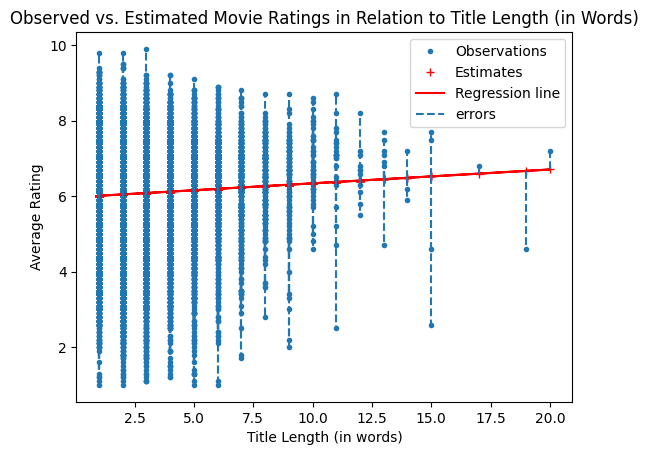

In [59]:
#Initialize regression model
model_words = sm.ols('averageRating ~ wordsInTitle',  data = final_master_df)
model_words = model_words.fit()
#Call linearity test for wordsinTitle
words_plot = linearity_test(model_words, final_master_df, 'averageRating', 'wordsInTitle', 'words_rating_est', 'Title Length (in words)', 'Average Rating', 'Observed vs. Estimated Movie Ratings in Relation to Title Length (in Words)',"Yes")
words_plot

In [60]:
#Roxanne
#OLS Summary
model_words.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     61.08
Date:                Mon, 12 Aug 2024   Prob (F-statistic):           5.69e-15
Time:                        02:54:51   Log-Likelihood:                -39767.
No. Observations:               24755   AIC:                         7.954e+04
Df Residuals:                   24753   BIC:                         7.955e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        5.9733      0.015    403.774      0.000       5.944       6.002
wordsInTitle     0.0367      0.005      7.815      0.000       0.027       0.046
==============================================================================
Omnibus:                     1941.389   Durbin-Watson:                   1.405
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2534.453
Skew:                          -0.695   Prob(JB):                         0.00
Kurtosis:                       3.726   Cond. No.                         6.55
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

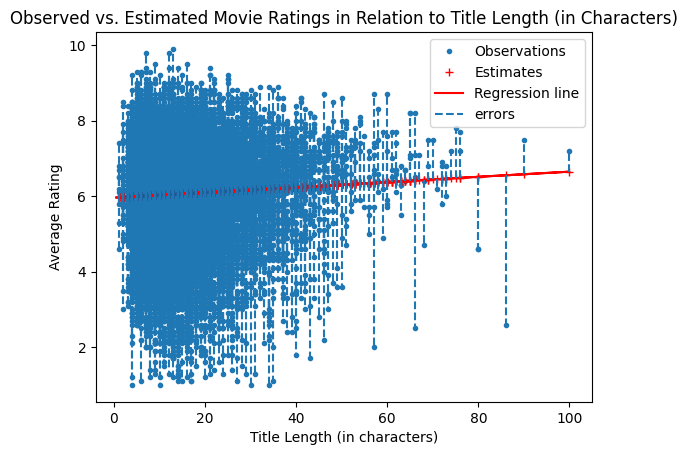

In [61]:
#Roxanne
#Initialize regression model
model_chars = sm.ols('averageRating ~ charsInTitle',  data = final_master_df)
model_chars = model_chars.fit()
#Call linearity test for charsinTitle
linearity_test(model_chars, final_master_df, 'averageRating', 'charsInTitle', 'chars_rating_est', 'Title Length (in characters)', 'Average Rating', 'Observed vs. Estimated Movie Ratings in Relation to Title Length (in Characters)','Yes')


In [62]:
#Roxanne
#OLS Summary
model_chars.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     57.50
Date:                Mon, 12 Aug 2024   Prob (F-statistic):           3.49e-14
Time:                        02:54:53   Log-Likelihood:                -39768.
No. Observations:               24755   AIC:                         7.954e+04
Df Residuals:                   24753   BIC:                         7.956e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        5.9696      0.016    383.745      0.000       5.939       6.000
charsInTitle     0.0068      0.001      7.583      0.000       0.005       0.009
==============================================================================
Omnibus:                     1964.732   Durbin-Watson:                   1.404
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2571.132
Skew:                          -0.700   Prob(JB):                         0.00
Kurtosis:                       3.730   Cond. No.                         35.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

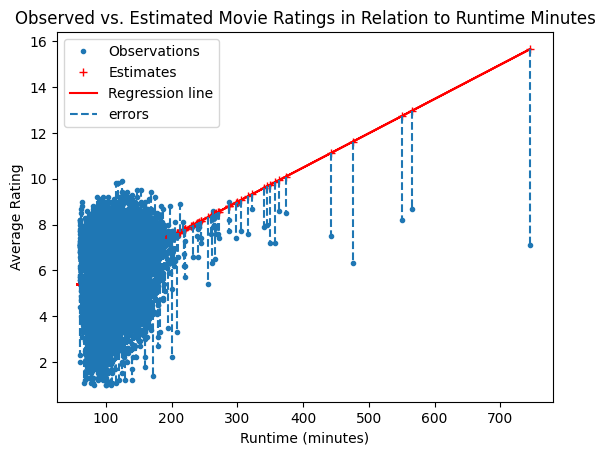

In [63]:
#Roxanne
#Initialize regression model
model_runtime = sm.ols('averageRating ~ runtimeMinutes',  data = final_master_df)
model_runtime = model_runtime.fit()
#Call linearity test for runtimeMinutes
linearity_test(model_runtime, final_master_df, 'averageRating', 'runtimeMinutes', 'runtime_rating_est', 'Runtime (minutes)', 'Average Rating', 'Observed vs. Estimated Movie Ratings in Relation to Runtime Minutes','Yes')

In [64]:
#Roxanne
#OLS Summary
model_runtime.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.076
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     2038.
Date:                Mon, 12 Aug 2024   Prob (F-statistic):               0.00
Time:                        02:54:55   Log-Likelihood:                -38818.
No. Observations:               24755   AIC:                         7.764e+04
Df Residuals:                   24753   BIC:                         7.766e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          4.4950      0.036    125.873      0.000       4.425       4.565
runtimeMinutes     0.0150      0.000     45.139      0.000       0.014       0.016
==============================================================================
Omnibus:                     2268.238   Durbin-Watson:                   1.465
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3216.557
Skew:                          -0.736   Prob(JB):                         0.00
Kurtosis:                       3.977   Cond. No.                         521.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

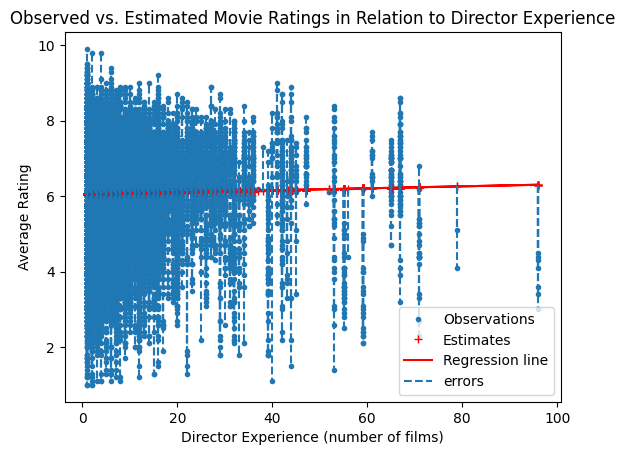

In [65]:
#Roxanne
#Plot Director Experience (number of titles by director) vs. Average Rating
# Initialize the regression model
model_director_exp = sm.ols('averageRating ~ numTitleByDirector', data = final_master_df)
model_director_exp = model_director_exp.fit()
#Call linearity test for Director Experience
linearity_test(model_director_exp, final_master_df, 'averageRating', 'numTitleByDirector','director_exp_rating_est', 'Director Experience (number of films)' , 'Average Rating', 'Observed vs. Estimated Movie Ratings in Relation to Director Experience','Yes')

In [66]:
#Roxanne
#OLS summary
model_director_exp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     10.58
Date:                Mon, 12 Aug 2024   Prob (F-statistic):            0.00114
Time:                        02:54:58   Log-Likelihood:                -39792.
No. Observations:               24755   AIC:                         7.959e+04
Df Residuals:                   24753   BIC:                         7.960e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              6.0500      0.010    588.703      0.000       6.030       6.070
numTitleByDirector     0.0026      0.001      3.253      0.001       0.001       0.004
==============================================================================
Omnibus:                     1948.621   Durbin-Watson:                   1.405
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2541.055
Skew:                          -0.698   Prob(JB):                         0.00
Kurtosis:                       3.719   Cond. No.                         17.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

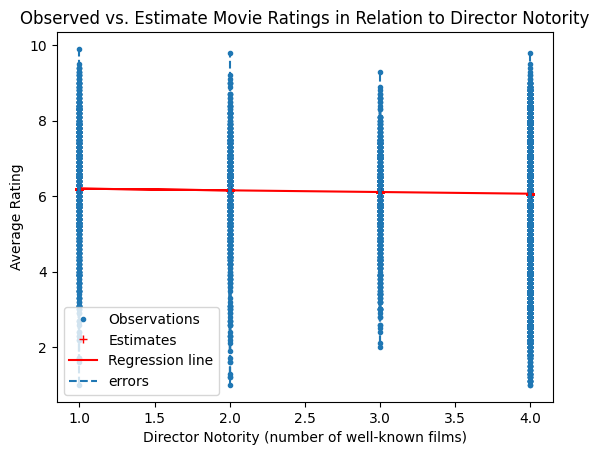

In [67]:
#Roxanne
#Plot Director Notority (number of titles director is known for) vs. Average Rating
# Initialize the regression model
model_director_not = sm.ols('averageRating ~ numKownForTitles', data = final_master_df)
model_director_not = model_director_not.fit()
linearity_test(model_director_not, final_master_df, 'averageRating','numKownForTitles','director_not_rating_est', 'Director Notority (number of well-known films)', 'Average Rating', 'Observed vs. Estimate Movie Ratings in Relation to Director Notority','Yes')

In [68]:
#Roxanne
#OLS summary
model_director_not.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     11.82
Date:                Mon, 12 Aug 2024   Prob (F-statistic):           0.000588
Time:                        02:55:00   Log-Likelihood:                -39791.
No. Observations:               24755   AIC:                         7.959e+04
Df Residuals:                   24753   BIC:                         7.960e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            6.2430      0.050    124.179      0.000       6.144       6.342
numKownForTitles    -0.0445      0.013     -3.437      0.001      -0.070      -0.019
==============================================================================
Omnibus:                     1963.728   Durbin-Watson:                   1.404
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2554.543
Skew:                          -0.704   Prob(JB):                         0.00
Kurtosis:                       3.704   Cond. No.                         27.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

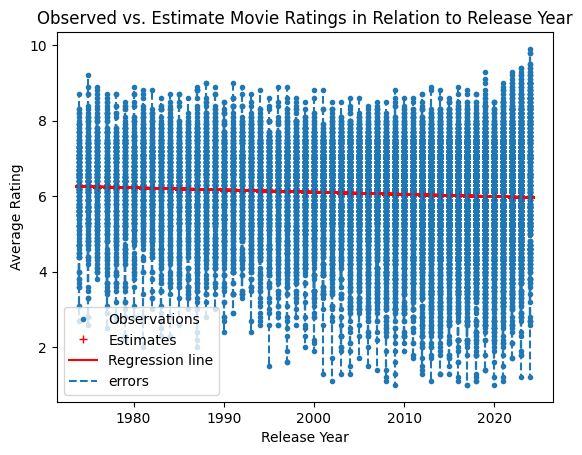

In [69]:
#Roxanne
#Plot Start Year vs. Average Rating
# Initialize the regression model
model_year = sm.ols('averageRating ~ startYear', data = final_master_df)
model_year = model_year.fit()
#Call the linearity test
linearity_test(model_year, final_master_df, 'averageRating', 'startYear', 'year_rating_est', 'Release Year', 'Average Rating', 'Observed vs. Estimate Movie Ratings in Relation to Release Year','Yes')

In [70]:
#Roxanne
#OLS Summary
model_year.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     100.9
Date:                Mon, 12 Aug 2024   Prob (F-statistic):           1.07e-23
Time:                        02:55:03   Log-Likelihood:                -39747.
No. Observations:               24755   AIC:                         7.950e+04
Df Residuals:                   24753   BIC:                         7.951e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     17.7892      1.166     15.251      0.000      15.503      20.075
startYear     -0.0058      0.001    -10.045      0.000      -0.007      -0.005
==============================================================================
Omnibus:                     1882.828   Durbin-Watson:                   1.405
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2433.401
Skew:                          -0.685   Prob(JB):                         0.00
Kurtosis:                       3.696   Cond. No.                     3.06e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.06e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

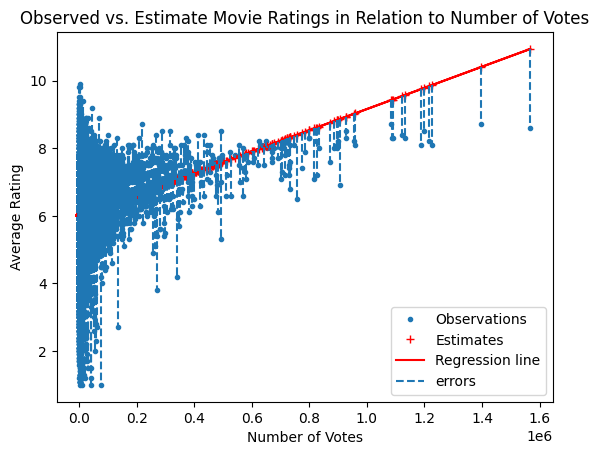

In [71]:
#Roxanne
#Plot Start Year vs. Average Rating
# Initialize the regression model
model_votes = sm.ols('averageRating ~ numVotes', data = final_master_df)
model_votes = model_votes.fit()
linearity_test(model_votes, final_master_df, 'averageRating', 'numVotes', 'votes_rating_est', 'Number of Votes','Average Rating', 'Observed vs. Estimate Movie Ratings in Relation to Number of Votes', 'Yes')

In [72]:
#Roxanne
model_votes.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          averageRating   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     565.7
Date:                Mon, 12 Aug 2024   Prob (F-statistic):          1.18e-123
Time:                        02:55:04   Log-Likelihood:                -39517.
No. Observations:               24755   AIC:                         7.904e+04
Df Residuals:                   24753   BIC:                         7.905e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      6.0280      0.008    771.479      0.000       6.013       6.043
numVotes    3.128e-06   1.32e-07     23.784      0.000    2.87e-06    3.39e-06
==============================================================================
Omnibus:                     1904.171   Durbin-Watson:                   1.414
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2489.754
Skew:                          -0.683   Prob(JB):                         0.00
Kurtosis:                       3.740   Cond. No.                     6.12e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.12e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Normal Distribution Test

In [73]:
#Function to calculate the residual values
def calculate_residuals(model, features, label):
    predictions = model.predict(features)
    df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})
    df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])

    return df_results

In [74]:
#Roxanne
#Function to test normality of residuals
def normal_errors_assumption(model, features, label, title_name, p_value_thresh=0.05):

    # Calculating residuals for the Anderson-Darling test
    df_results = calculate_residuals(model, features, label)

    # Performing the test on the residuals
    p_value = normal_ad(df_results['Residuals'])[1]
    print('p-value from the test - below 0.05 generally means non-normal:', p_value)

    # Reporting the normality of the residuals
    if p_value < p_value_thresh:
        print('Residuals are not normally distributed')
    else:
        print('Residuals are normally distributed')

    textstr =  'p-value =', p_value

  # Plotting the residuals distribution
    plt.title(title_name)
    plt.annotate(textstr, xy=(0.05, 0.95), xycoords='axes fraction')
    sns.distplot(df_results['Residuals'])
    plt.show()

    print()
    if p_value > p_value_thresh:
        print('Assumption satisfied')
    else:
        print('Assumption not satisfied')


p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




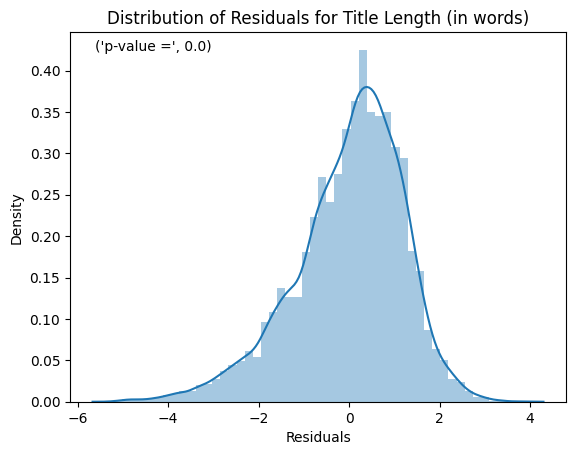


Assumption not satisfied


In [75]:
#Roxanne
#Calls function to test normal distribution of residuals for "Words in Title"
normal_errors_assumption(model_words, final_master_df.wordsInTitle, final_master_df.averageRating, 'Distribution of Residuals for Title Length (in words)')

p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




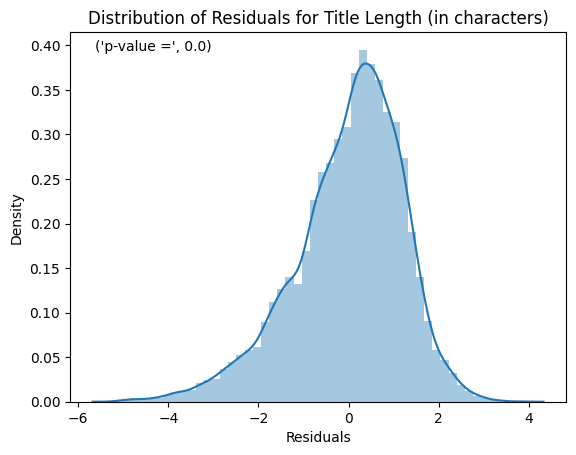


Assumption not satisfied


In [76]:
#Roxanne
#Calls function to test normal distribution of residuals for "Characters in Title"
normal_errors_assumption(model_chars, final_master_df.charsInTitle, final_master_df.averageRating, 'Distribution of Residuals for Title Length (in characters)')

p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




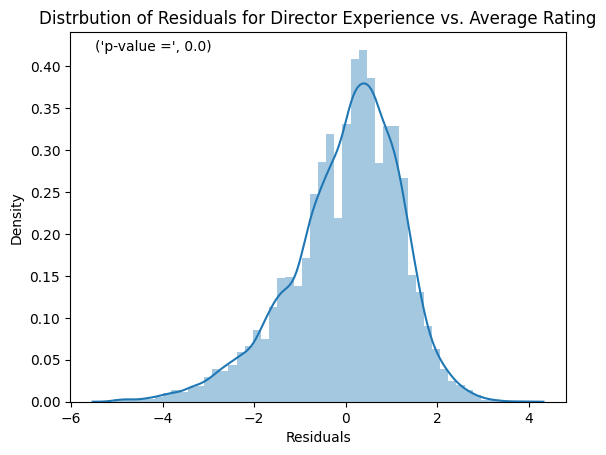


Assumption not satisfied


In [77]:
#Roxanne
#Calls function to test normal distribution of residuals for "Number of Titles for Director"
normal_errors_assumption(model_director_exp, final_master_df.numTitleByDirector, final_master_df.averageRating, 'Distrbution of Residuals for Director Experience vs. Average Rating')

p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




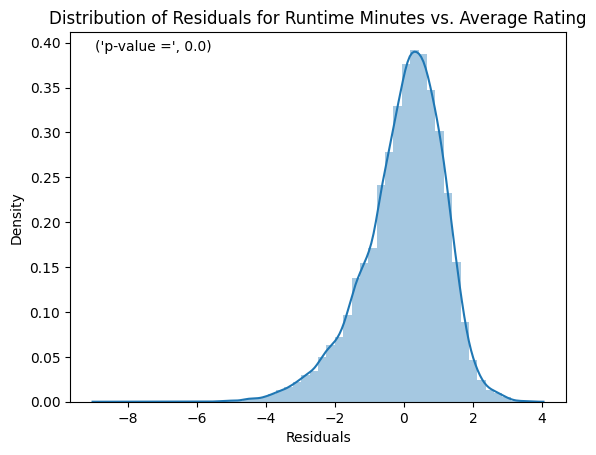


Assumption not satisfied


In [78]:
#Roxanne
#Calls function to test normal distribution of residuals for "Runtime Minutes"
normal_errors_assumption(model_runtime, final_master_df.runtimeMinutes, final_master_df.averageRating, 'Distribution of Residuals for Runtime Minutes vs. Average Rating')

p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




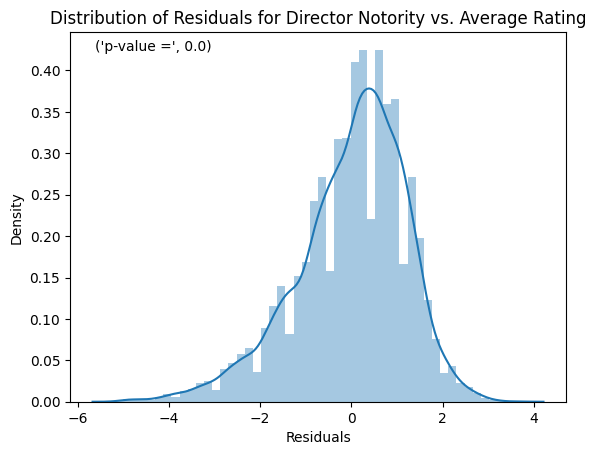


Assumption not satisfied


In [79]:
#Roxanne
#Calls function to test normal distribution of residuals for "Number of Titles Director is Known For"
normal_errors_assumption(model_director_not, final_master_df.numKownForTitles, final_master_df.averageRating, 'Distribution of Residuals for Director Notority vs. Average Rating')

p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




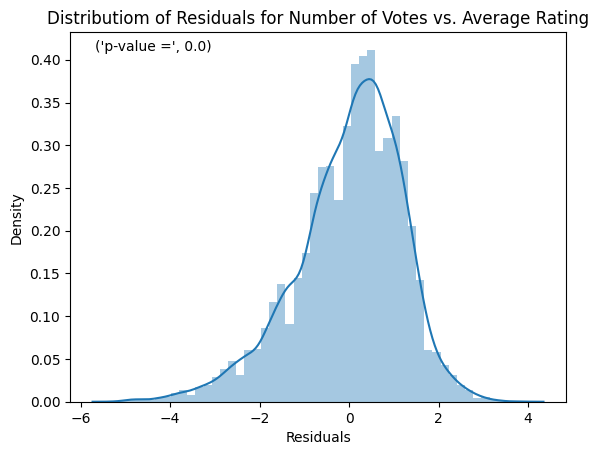


Assumption not satisfied


In [80]:
#Roxanne
#Calls function to test normal distribution of residuals for "Number of Votes"
normal_errors_assumption(model_votes, final_master_df.numVotes, final_master_df.averageRating, 'Distributiom of Residuals for Number of Votes vs. Average Rating')

p-value from the test - below 0.05 generally means non-normal: 0.0
Residuals are not normally distributed


<ipython-input-74-e273173ded36>:23: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




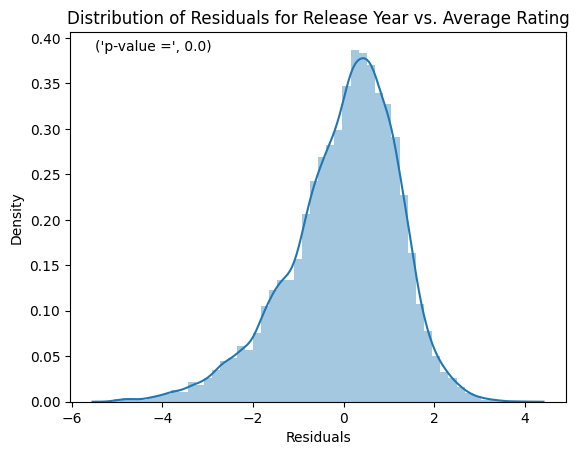


Assumption not satisfied


In [81]:
#Roxanne
#Calls function to test normal distribution of residuals for "Start Year"
normal_errors_assumption(model_year, final_master_df.startYear, final_master_df.averageRating, 'Distribution of Residuals for Release Year vs. Average Rating')

#Colinearity Test

In [82]:
# Extracting the independent variables used in the model
X = model.model.exog

# Creating a DataFrame to store VIF values
vif_data = pd.DataFrame()
vif_data['Variable'] = model.model.exog_names
vif_data['VIF'] = [variance_inflation_factor(X, i) for i in range(X.shape[1])]

print(vif_data)

            Variable           VIF
0          Intercept  25032.500512
1          startYear      1.063377
2     runtimeMinutes      1.131472
3           numVotes      1.046369
4   numKownForTitles      1.054749
5             Action      1.253884
6          Adventure      1.225015
7          Animation      1.100993
8          Biography      1.111466
9             Comedy      1.470824
10             Crime      1.142268
11       Documentary      1.407420
12             Drama      1.623409
13           Fantasy      1.048871
14           History      1.090465
15            Horror      1.322974
16             Music      1.047617
17           Romance      1.155025
18             SciFi      1.076079
19          Thriller      1.294670
20           Western      1.008019


In [83]:
#features that were assumed to be correlated with the rating
correlated_features = ['startYear','wordsInTitle', 'charsInTitle',
       'Action', 'Adult', 'Adventure', 'Animation', 'Biography', 'Comedy',
       'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 'History',
       'Horror', 'Music', 'Musical', 'Mystery', 'News', 'Romance', 'SciFi',
       'Sport', 'Thriller', 'War', 'Western'
]

In [84]:
X = final_master_df[correlated_features]
y = master_df['averageRating']

# Split the data into training and testing sets on the selected correlated features
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (assumed correlated features): {mse}')
print(f'R² Score(assumed correlated features): {r2}')

# cross-validation
cv_scores = cross_val_score(model, X, y, cv=5, scoring='r2')

print(f'Cross-Validation R² Scores (assumed correlated features): {cv_scores}')
print(f'Average R² Score (assumed correlated features): {cv_scores.mean()}')

Mean Squared Error (assumed correlated features): 1.0766619470624383
R² Score(assumed correlated features): 0.24619269192229176
Cross-Validation R² Scores (assumed correlated features): [0.2405439  0.23325958 0.2293833  0.25924791 0.17432612]
Average R² Score (assumed correlated features): 0.2273521625636202


In [85]:
#features that were assumed to be uncorrelated with the rating
uncorrelated_features = ['runtimeMinutes',
       'numVotes',
       'numKownForTitles', 'numTitleByDirector', 'topDirector', 'sqr_runtime',
]

X = final_master_df[uncorrelated_features]
y = master_df['averageRating']

# Split the data into training and testing sets on the selected uncorrelated features
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (assumed uncorrelated features): {mse}')
print(f'R² Score(assumed uncorrelated features): {r2}')

# cross-validation
cv_scores = cross_val_score(model, X, y, cv=5, scoring='r2')

print(f'Cross-Validation R² Scores (assumed uncorrelated features): {cv_scores}')
print(f'Average R² Score (assumed uncorrelated features): {cv_scores.mean()}')

Mean Squared Error (assumed uncorrelated features): 1.2944147064267826
R² Score(assumed uncorrelated features): 0.09373664774725765
Cross-Validation R² Scores (assumed uncorrelated features): [0.13577686 0.08236213 0.08054743 0.08489973 0.05538723]
Average R² Score (assumed uncorrelated features): 0.08779467678068324


#Heteroscedasticity Test

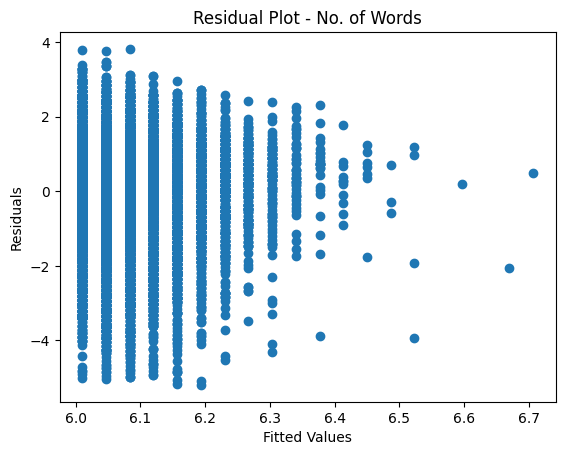

In [86]:
#Thom

#Checking heteroscedasticity of no. of words model
fitted_vals = model_words.fittedvalues
residuals = model_words.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - No. of Words')
plt.show()


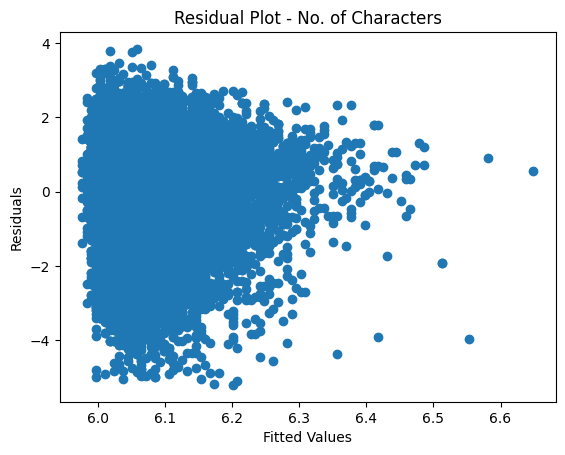

In [87]:
#Thom

#Checking heteroscedasticity of no. of characters model
fitted_vals = model_chars.fittedvalues
residuals = model_chars.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - No. of Characters')
plt.show()

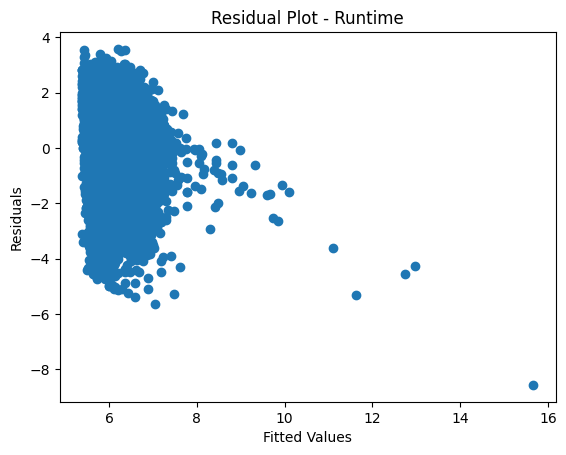

In [88]:
#Thom

#Checking heteroscedasticity of runtime model
fitted_vals = model_runtime.fittedvalues
residuals = model_runtime.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - Runtime')
plt.show()

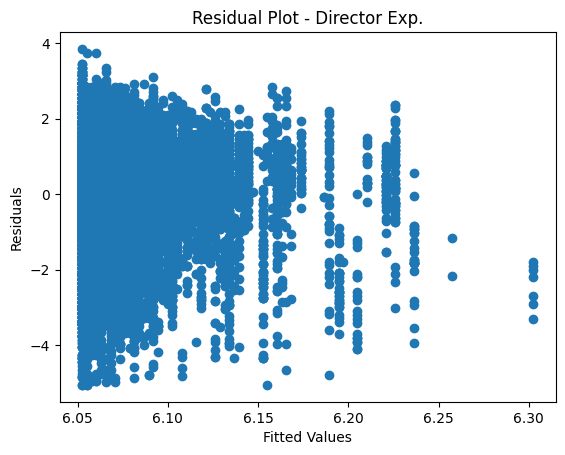

In [89]:
#Thom

#Checking heteroscedasticity of director exp model
fitted_vals = model_director_exp.fittedvalues
residuals = model_director_exp.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - Director Exp.')
plt.show()

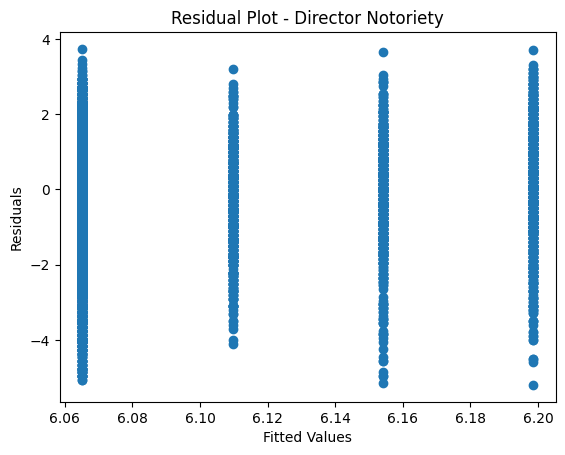

In [90]:
#Thom

#Checking heteroscedasticity of director notoriety model
fitted_vals = model_director_not.fittedvalues
residuals = model_director_not.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - Director Notoriety')
plt.show()

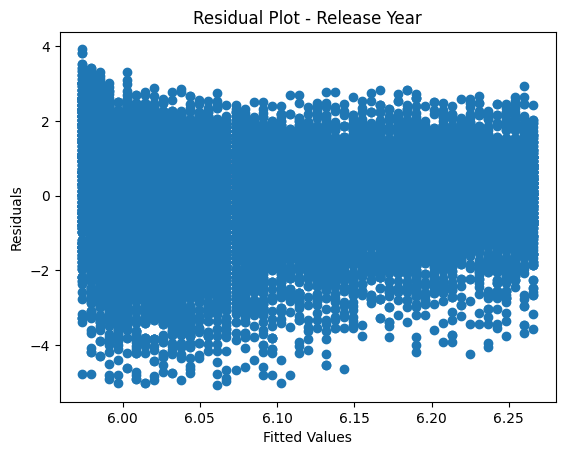

In [91]:
#Thom

#Checking heteroscedasticity of release year model
fitted_vals = model_year.fittedvalues
residuals = model_year.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - Release Year')
plt.show()

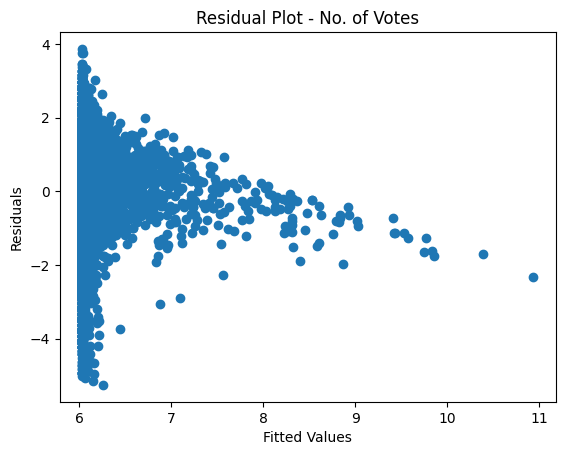

In [92]:
#Thom

#Checking heteroscedasticity of no. of votes model
fitted_vals = model_votes.fittedvalues
residuals = model_votes.resid

plt.scatter(fitted_vals, residuals)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot - No. of Votes')
plt.show()

#Average Rating by Genre

In [93]:
#Tayseer
genre_df_exploded_sorted = genre_df2.sort_values(by='averageRating')

In [94]:
genre_colors = {
    'Drama': 'rgb(255, 0, 0)',       # Red
    'Sci-Fi': 'rgb(0, 255, 0)',      # Lime
    'Crime': 'rgb(0, 0, 255)',       # Blue
    'Mystery': 'rgb(255, 255, 0)',   # Yellow
    'Romance': 'rgb(0, 255, 255)',   # Cyan
    'Thriller': 'rgb(255, 0, 255)',  # Magenta
    'Comedy': 'rgb(192, 192, 192)',  # Silver
    'Biography': 'rgb(128, 0, 0)',   # Maroon
    'Music': 'rgb(128, 128, 0)',     # Olive
    'Documentary': 'rgb(0, 128, 0)', # Green
    'History': 'rgb(128, 0, 128)',   # Purple
    'Action': 'rgb(0, 128, 128)',    # Teal
    'Fantasy': 'rgb(0, 0, 128)',     # Navy
    'Horror': 'rgb(255, 165, 0)',    # Orange
    'War': 'rgb(255, 192, 203)',     # Pink
    'Adventure': 'rgb(105, 105, 105)', # Dim Gray
    'Family': 'rgb(255, 105, 180)',  # Hot Pink
    'Adult': 'rgb(60, 179, 113)',    # Medium Sea Green
    'Sport': 'rgb(123, 104, 238)',   # Medium Slate Blue
    'Musical': 'rgb(240, 128, 128)', # Light Coral
    'Animation': 'rgb(255, 20, 147)', # Deep Pink
    'News': 'rgb(173, 216, 230)'     # Light Blue
    }

In [95]:
genre_df_exploded_sorted['color'] = genre_df_exploded_sorted['genres'].map(genre_colors)



In [96]:
for genres in genre_exploded_unique_values:
  fig = px.scatter(
    genre_df_exploded_sorted,
    x=genre_df_exploded_sorted.groupby('genres').cumcount(),
    y='averageRating',
    color='genres',
    color_discrete_map=genre_colors,  # Map colors to genres
    labels={'x': 'Data Point Index', 'averageRating': 'Average Rating'},
    title='Scatter Plot of Average Rating by Genre')

fig.show()

# Data Transformations

In [97]:
#Roxanne
#Function to perform transformation all at once
def transform_data(variable_name):
  #Square root transformation
  final_master_df['sqrt_' + variable_name] = final_master_df[variable_name].apply(lambda rt: math.sqrt(rt))
  #Log transformation
  final_master_df['log_' + variable_name] = final_master_df[variable_name].apply(lambda rt: math.log(rt))
  #Recipripocal transformation
  temp = 1/(final_master_df[variable_name])
  final_master_df['rec_' + variable_name] = temp.tolist()
  #Square transformation
  temp = (final_master_df[variable_name])**2
  final_master_df['square_' + variable_name] = temp.tolist()
  #Boxcox transformation
  temp, lam = boxcox(final_master_df[variable_name])
  final_master_df['bcx_' + variable_name] = temp.tolist()


In [98]:
#Roxanne
#Call function to transform each variable
#Transform wordsinTitle
transform_data('wordsInTitle')
#Transform charactersinTitle
transform_data('charsInTitle')
#Transform numVotes
transform_data('numVotes')
#Transform numTitlesbyDieector
transform_data('numTitleByDirector')
#Transform runtimeMinutes
transform_data('runtimeMinutes')
#Transform numKownforTitles
transform_data('numKownForTitles')
#Transform startYear
transform_data('startYear')

In [99]:
#Roxanne
#Function to call plot each transformed variable vs. averageRating
def transformation_manager(variable_name, x_axis, variable_desc):
  #Initialize regression model for log transformation
  model_temp = sm.ols('averageRating ~ log_' + variable_name ,  data = final_master_df)
  model_temp = model_temp.fit()
  #Call linearity test
  linearity_test(model_temp, final_master_df, 'averageRating', 'log_' + variable_name, 'log_temp_rating_est', 'log of ' + x_axis, 'Average Rating','Linearity Test of Average Rating vs. Log of ' + variable_desc, 'Yes')

  #Initialize regression model for square root transformation
  model_temp = sm.ols('averageRating ~ sqrt_' + variable_name ,  data = final_master_df)
  model_temp = model_temp.fit()
  #Call linearity test
  linearity_test(model_temp, final_master_df, 'averageRating', 'sqrt_' + variable_name, 'sqrt_temp_rating_est', 'square root of ' + x_axis, 'Average Rating','Linearity Test of Average Rating vs. Square Root of ' + variable_desc, 'Yes')

  #Initialize regression model for square transformation
  model_temp = sm.ols('averageRating ~ square_' + variable_name ,  data = final_master_df)
  model_temp = model_temp.fit()
  #Call linearity test
  linearity_test(model_temp, final_master_df, 'averageRating', 'square_' + variable_name, 'square_temp_rating_est', 'square of ' + x_axis, 'Average Rating','Linearity Test of Average Rating vs. Square of ' + variable_desc, 'Yes')

  #Initialize regression model for reciprocal transformation
  model_temp = sm.ols('averageRating ~ rec_' + variable_name ,  data = final_master_df)
  model_temp = model_temp.fit()
  #Call linearity test
  linearity_test(model_temp, final_master_df, 'averageRating', 'rec_' + variable_name, 'rec_temp_rating_est', 'reciprocal of' + x_axis, 'Average Rating','Linearity Test of Average Rating vs. Reciprocal of ' + variable_desc, 'Yes')

  #Initialize regression model for reciprocalBox-Cox transformation
  model_temp = sm.ols('averageRating ~ bcx_' + variable_name ,  data = final_master_df)
  model_temp = model_temp.fit()
  #Call linearity test
  linearity_test(model_temp, final_master_df, 'averageRating', 'bcx_' + variable_name, 'bcx_temp_rating_est', 'boxcox of ' + x_axis, 'Average Rating','Linearity Test of Average Rating vs. Box-cox Transformation of ' + variable_desc, 'Yes')



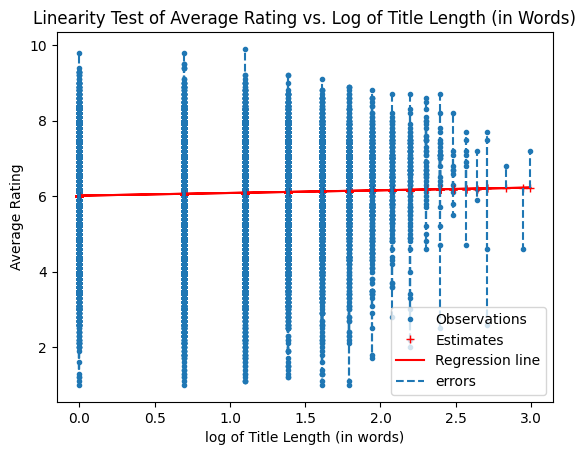

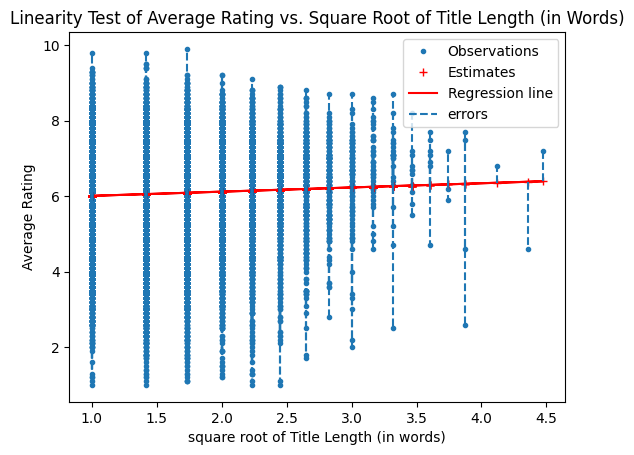

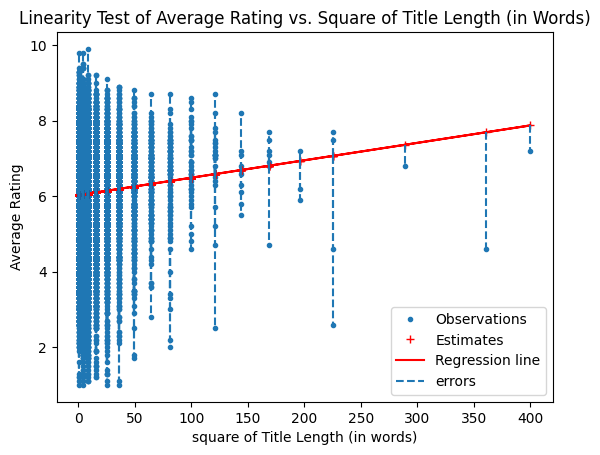

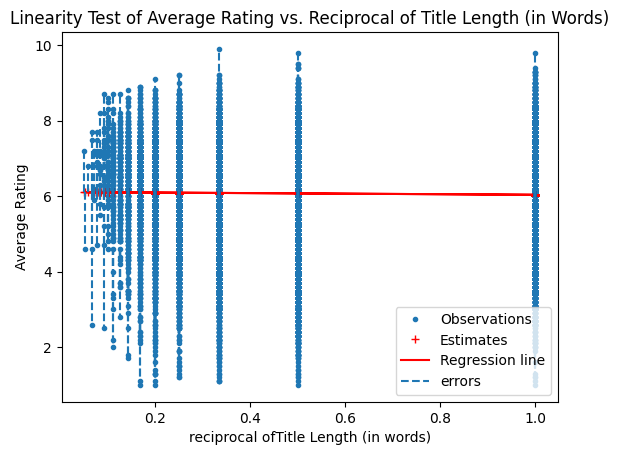

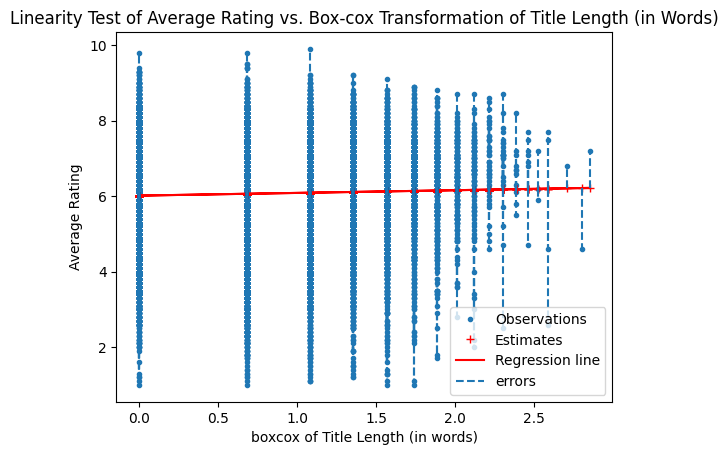

In [100]:
#Roxanne
#Call transformation manager for Title length in words
transformation_manager('wordsInTitle', 'Title Length (in words)', 'Title Length (in Words)')

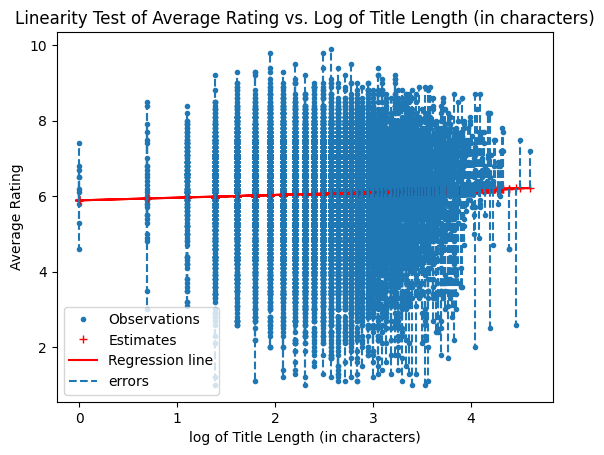

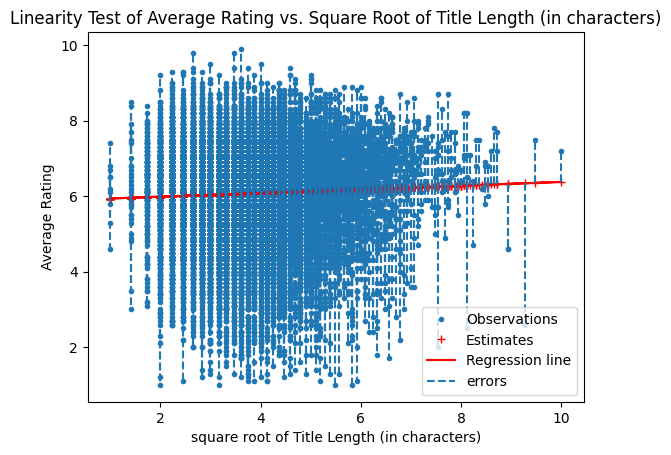

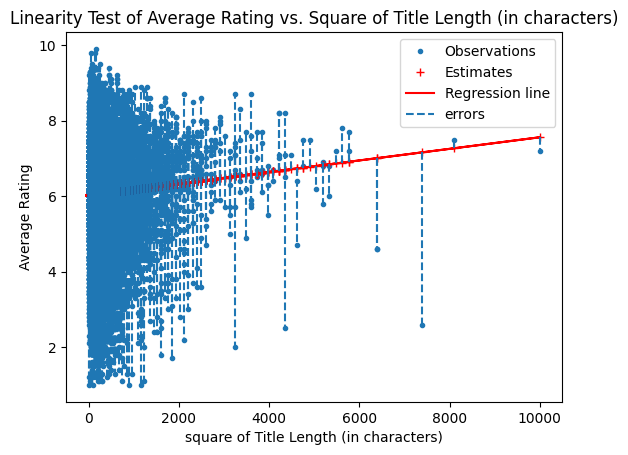

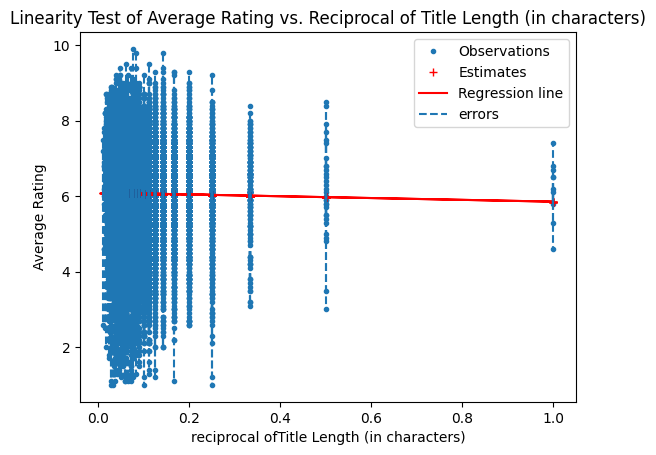

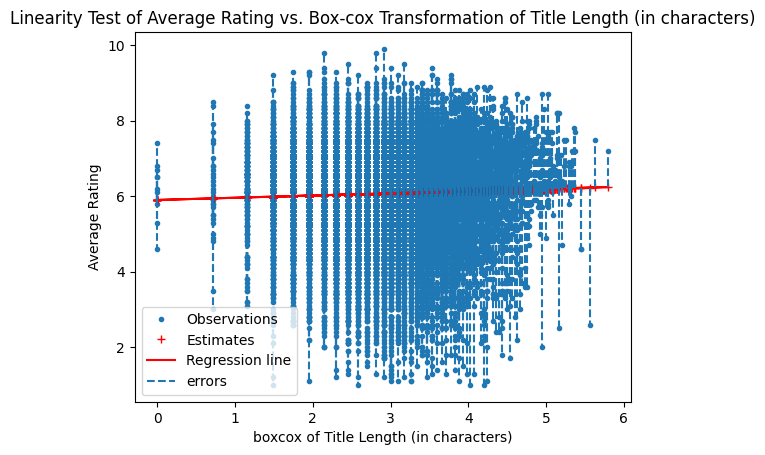

In [101]:
#Roxanne
#Call transformation manager for Title length in words
transformation_manager('charsInTitle', 'Title Length (in characters)', 'Title Length (in characters)')

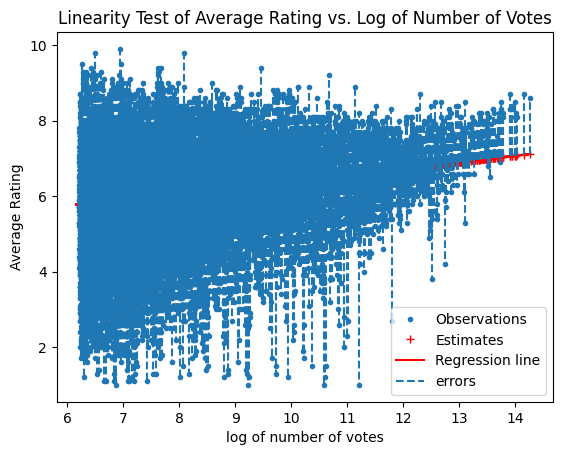

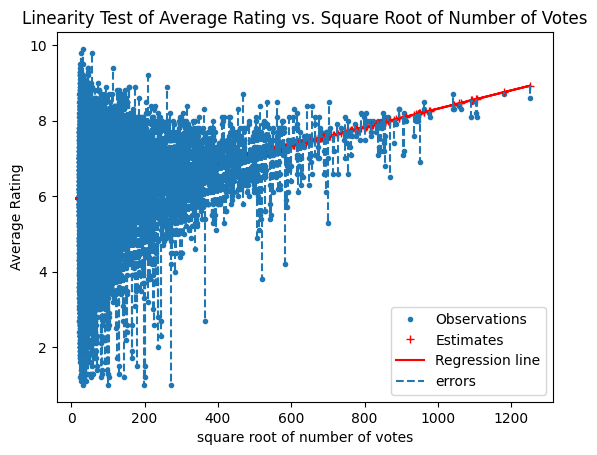

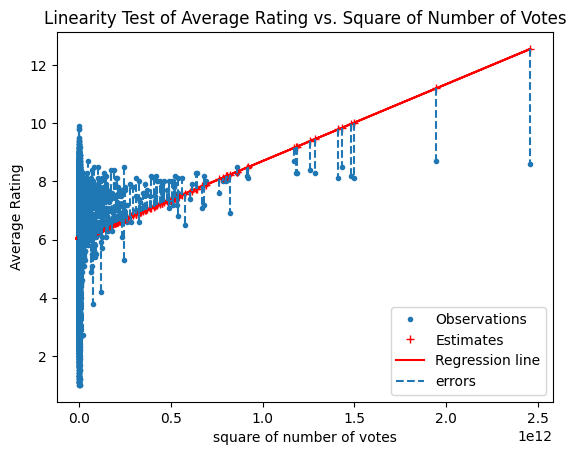

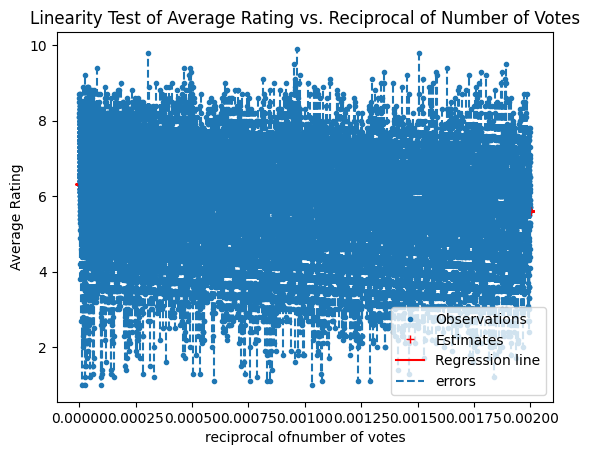

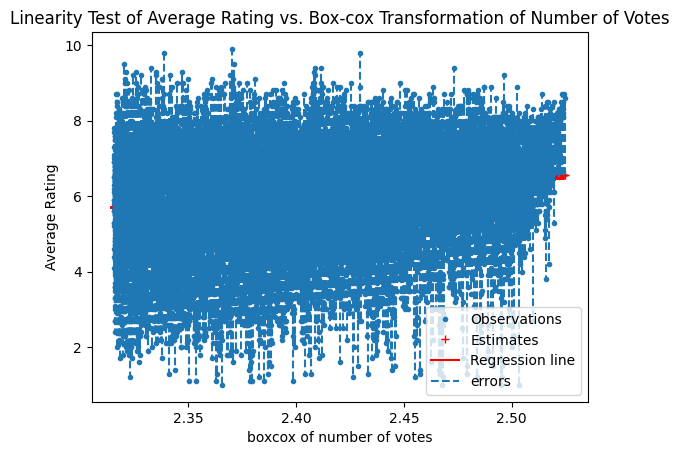

In [102]:
#Roxanne
#Call transformation manager for Number of Votes
transformation_manager('numVotes', 'number of votes', 'Number of Votes')

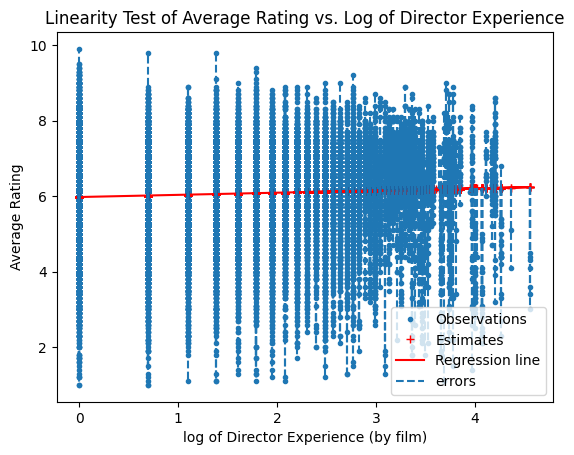

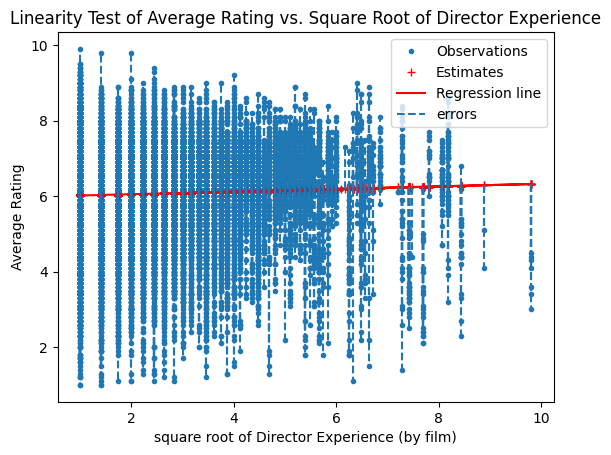

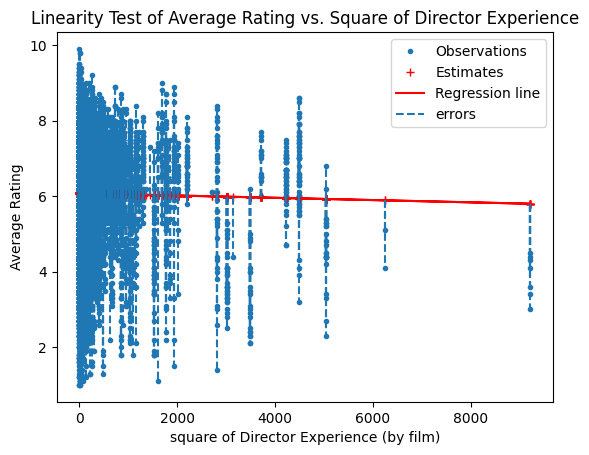

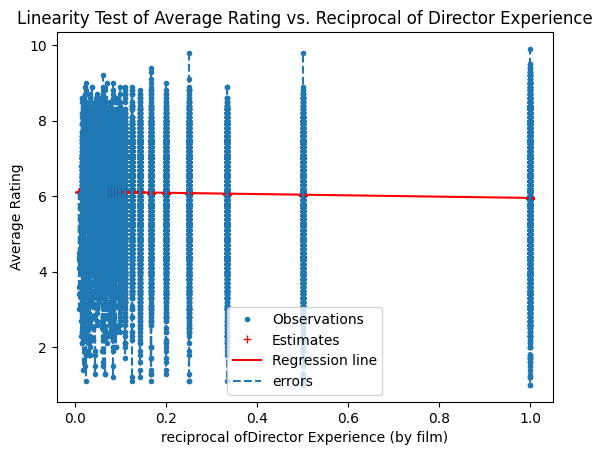

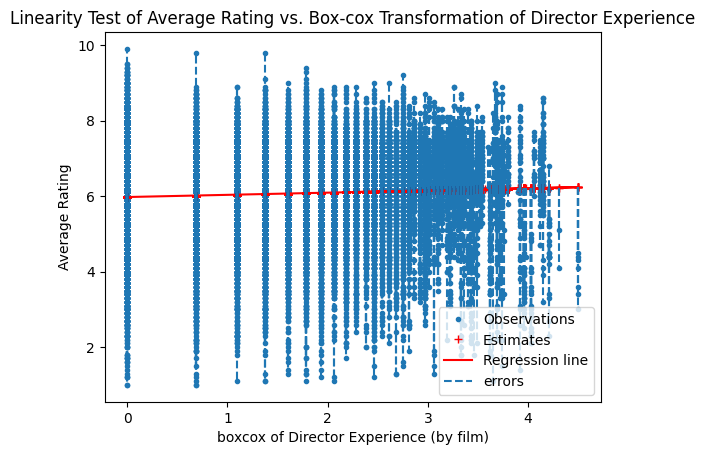

In [103]:
#Roxanne
#Call transformation manager for Director Experience
transformation_manager('numTitleByDirector', 'Director Experience (by film)', 'Director Experience')

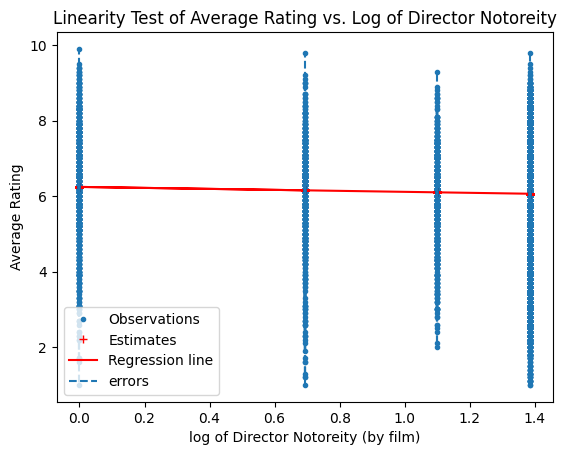

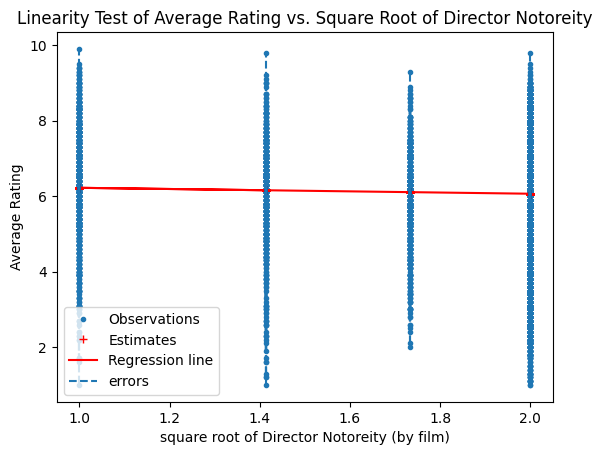

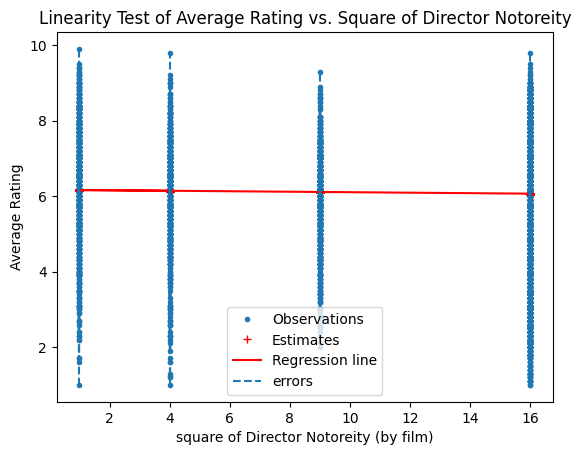

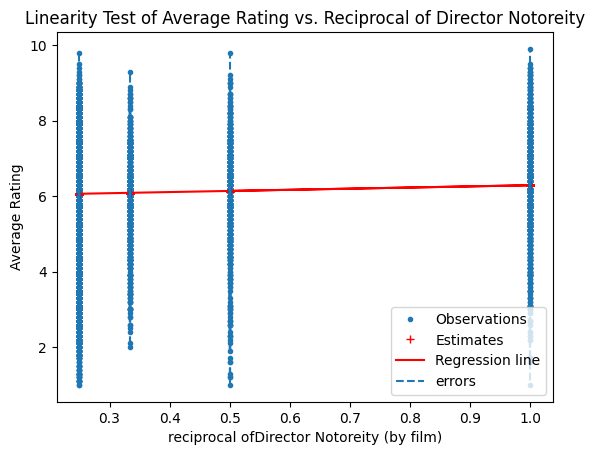

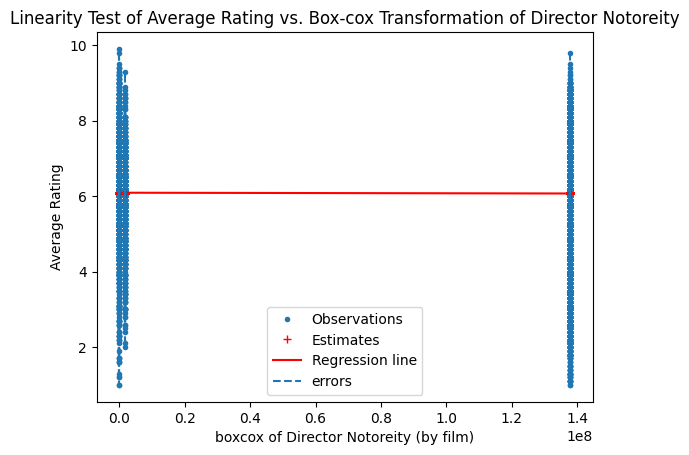

In [104]:
#Roxanne
#Call transformation manager for Director Notoreity
transformation_manager('numKownForTitles', 'Director Notoreity (by film)', 'Director Notoreity')

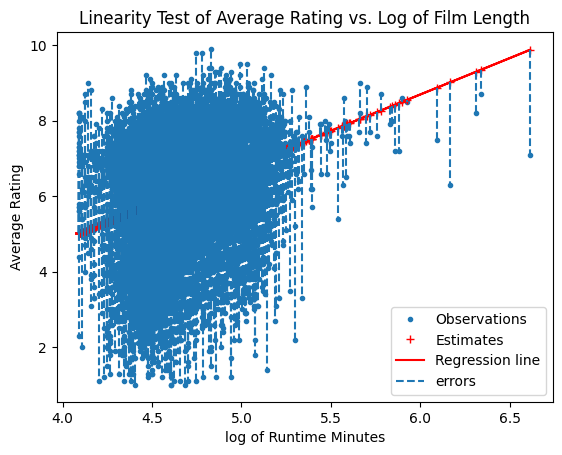

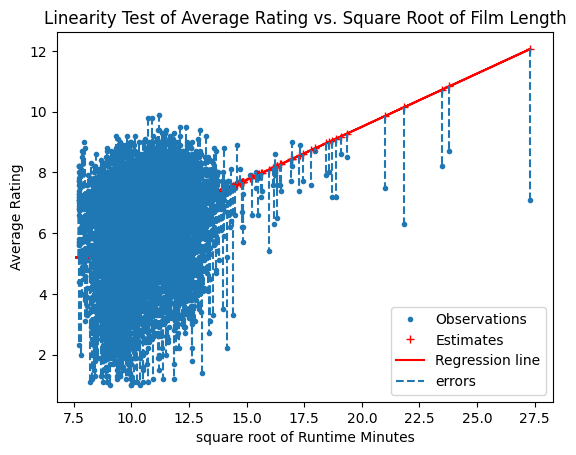

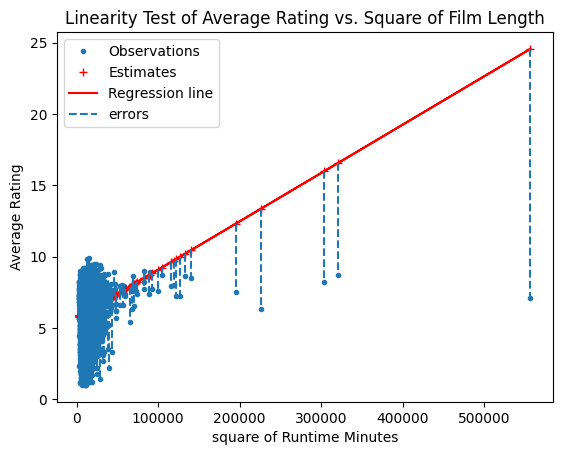

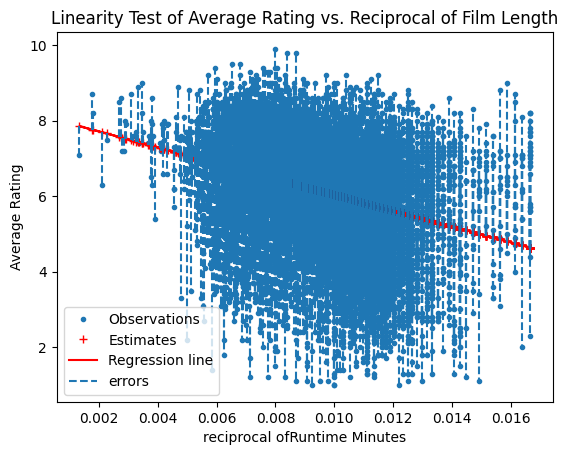

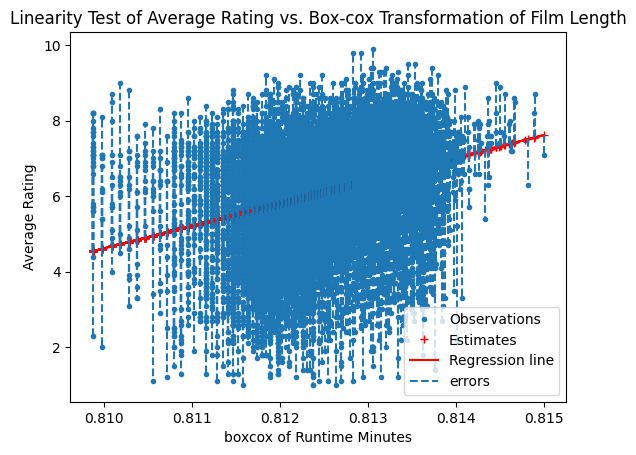

In [105]:
#Roxanne
#Call transformation manager for Runtime Minutes
transformation_manager('runtimeMinutes', 'Runtime Minutes', 'Film Length')

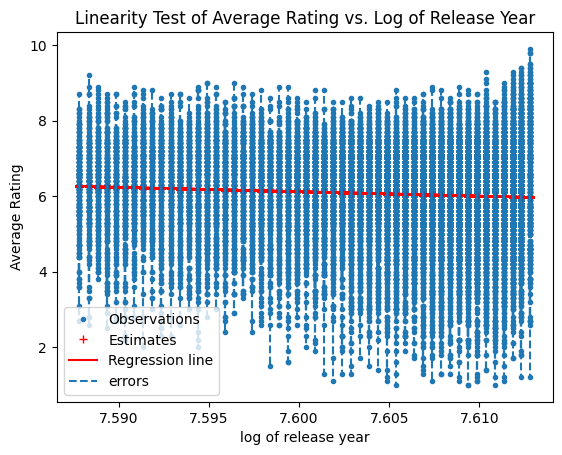

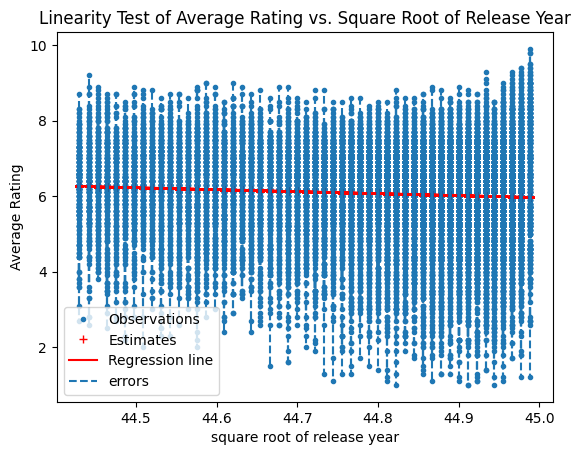

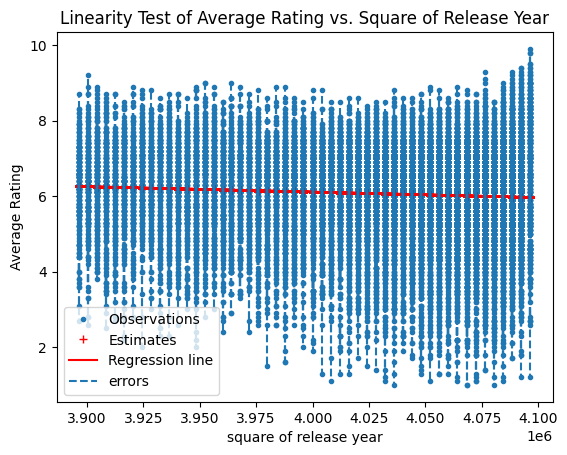

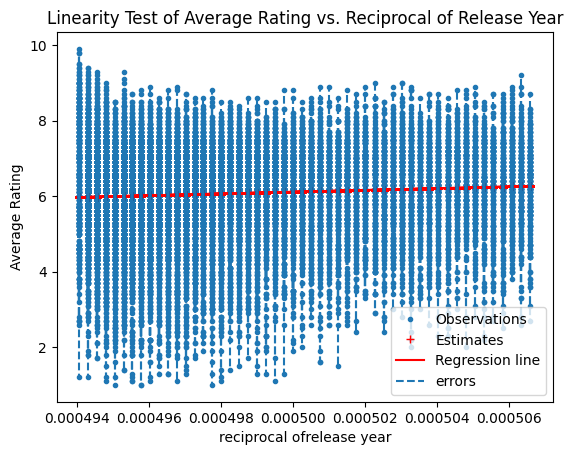

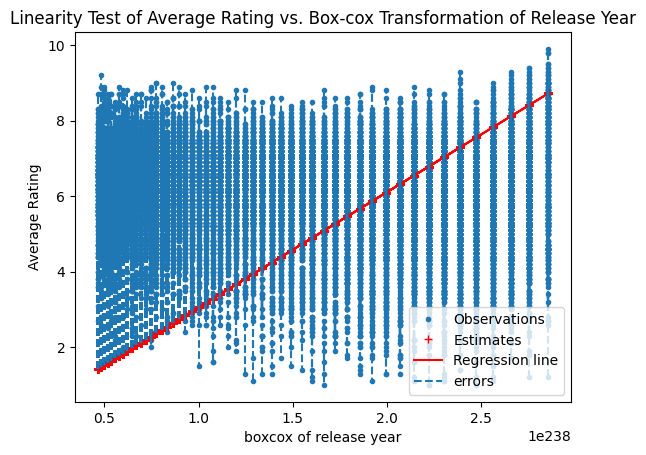

In [106]:
#Roxanne
#Call transformation manager for Release Year
transformation_manager('startYear', 'release year', 'Release Year')